# Analysing Cuisins from All Around The World

In [295]:
# Importing relevant libraries

import numpy as np 
import pandas as pd 
from plotly.offline import init_notebook_mode

init_notebook_mode(connected=True)

import matplotlib.pyplot as plt

%matplotlib inline
import seaborn as sns
# color = sns.color_palette()

import itertools
from wordcloud import WordCloud 
from collections import Counter
import statistics 
from statistics import mode
import os


In [296]:
# Checking the folder which contains the data
os.listdir(r"C:\Users\Orel Ben Israel\Desktop\א. דאטה")

['.ipynb_checkpoints',
 'British_crowler_recipes.py',
 'british_filter_links.py',
 'british_ing_from_links_list_.py',
 'Cuisines Code.ipynb',
 'extra',
 'ezer.py',
 'helper.py',
 'train.json',
 'usa_crowler_last.py']

In [297]:
# Comment for Dafna - in this address put the adress of the JSON file named "train"

# load the relevant data file

train = pd.read_json(r"C:\Users\Orel Ben Israel\Desktop\א. דאטה\train.json")

# Checking The Basic Information About The Data

In [298]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39774 entries, 0 to 39773
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           39774 non-null  int64 
 1   cuisine      39774 non-null  object
 2   ingredients  39774 non-null  object
dtypes: int64(1), object(2)
memory usage: 932.3+ KB


In [299]:
train.describe()

,id
count,39774.000000
mean,24849.536959
std,14360.035505
min,0.000000
25%,12398.250000
50%,24887.000000
75%,37328.500000
max,49717.000000


In [300]:
train.columns

Index(['id', 'cuisine', 'ingredients'], dtype='object')

In [301]:
train.head()

,id,cuisine,ingredients
0,10259,greek,"[romaine lettuce, black olives, grape tomatoes..."
1,25693,southern_us,"[plain flour, ground pepper, salt, tomatoes, g..."
2,20130,filipino,"[eggs, pepper, salt, mayonaise, cooking oil, g..."
3,22213,indian,"[water, vegetable oil, wheat, salt]"
4,13162,indian,"[black pepper, shallots, cornflour, cayenne pe..."


In [302]:
num_meals = train.shape[0]
print("The data contains " + str(num_meals) +" meals")

num_columns = train.shape[1]
print('The table has ' + str(num_columns) + " columns")

The data contains 39774 meals
The table has 3 columns


# Reality Check

In [303]:
# Calculing the median amoumt of ingredients in the dishes

length_dishes = []

for ingre in train["ingredients"]:
    length = len(ingre)
    length_dishes.append(length)
length_dishes.sort()

a = int(num_meals/2)
b = int((num_meals/2)+1)

median = (length_dishes[a] + length_dishes[b])/2

print("The Median Number of Ingredients in a Dish: " + str(median))

# Calculing the min amd the max amoumt of ingredients in the dishes

max_ingre = length_dishes[-1]
min_ingre = length_dishes[0]
print('Maximum Number of Ingredients in a Dish: ',max_ingre)
print('Minimum Number of Ingredients in a Dish: ',min_ingre)

The Median Number of Ingredients in a Dish: 10.0
Maximum Number of Ingredients in a Dish:  65
Minimum Number of Ingredients in a Dish:  1


In [304]:
# Calculing the average amoumt of ingredients in the dishes

num_ingre = sum(length_dishes)
average = num_ingre/num_meals

print("The Average Number of Ingredients in a Dish: " + str(average))

The Average Number of Ingredients in a Dish: 10.76771257605471


In [305]:
# create new column of the ingredients number of each dish

num_of_ingredients = []

for dish in train['ingredients']:
    num_of_ingredients.append(len(dish))

#Creating new column
train["num_of_ingredients"] = num_of_ingredients

train.head()

,id,cuisine,ingredients,num_of_ingredients
0,10259,greek,"[romaine lettuce, black olives, grape tomatoes...",9
1,25693,southern_us,"[plain flour, ground pepper, salt, tomatoes, g...",11
2,20130,filipino,"[eggs, pepper, salt, mayonaise, cooking oil, g...",12
3,22213,indian,"[water, vegetable oil, wheat, salt]",4
4,13162,indian,"[black pepper, shallots, cornflour, cayenne pe...",20


In [306]:
# Checking count of dishes contain 1 ingredient

little_ingre = train[train['num_of_ingredients'] == min_ingre ]
print("There are " + str(len(little_ingre)) + " dishes which contain one ingredient")
little_ingre

There are 22 dishes which contain one ingredient


,id,cuisine,ingredients,num_of_ingredients
940,4734,japanese,[sushi rice],1
2088,7833,vietnamese,[dried rice noodles],1
6787,36818,indian,[plain low-fat yogurt],1
7011,19772,indian,[unsalted butter],1
8181,16116,japanese,[udon],1
8852,29738,thai,[sticky rice],1
8990,41124,indian,[butter],1
10506,32631,mexican,[corn tortillas],1
13178,29570,thai,[grained],1
17804,29849,southern_us,[lemonade concentrate],1


In [307]:
# create new column of the ingredients number of each dish

num_of_ingredients = []

for dish in train['ingredients']:
    num_of_ingredients.append(len(dish))

#Creating new column
train["num_of_ingredients"] = num_of_ingredients

In [308]:
# Checking which cuisine has one ingredient

little_ingre['cuisine'].value_counts()

indian         6
thai           3
japanese       3
mexican        2
spanish        2
french         2
greek          1
italian        1
southern_us    1
vietnamese     1
Name: cuisine, dtype: int64

In [309]:
# printing the dishes with one ingredient

one_ingre_data = little_ingre[little_ingre['num_of_ingredients'] == min_ingre]

one_ingre_list = one_ingre_data["ingredients"].to_list()
merged_one_ingre_list = list(itertools.chain(*one_ingre_list))

# Checking the one ingredient dishes

print("The ingredients are: " + str(merged_one_ingre_list))

The ingredients are: ['sushi rice', 'dried rice noodles', 'plain low-fat yogurt', 'unsalted butter', 'udon', 'sticky rice', 'butter', 'corn tortillas', 'grained', 'lemonade concentrate', 'jasmine rice', 'unsalted butter', 'cherry tomatoes', 'butter', 'cumin seed', 'haricots verts', 'vegetable oil', 'spanish chorizo', 'sweetened condensed milk', 'water', 'phyllo', 'unsalted butter']


In [310]:
many_ingre = train[train['num_of_ingredients'] == max_ingre ]
many_ingre

,id,cuisine,ingredients,num_of_ingredients
15289,3885,italian,"[fettucine, fresh marjoram, minced garlic, oli...",65


In [311]:
print(str(many_ingre["ingredients"].to_list()))

[['fettucine', 'fresh marjoram', 'minced garlic', 'olive oil', 'garlic powder', 'large eggs', 'Alfredo sauce', 'vegetable oil', 'cajun seasoning', 'shredded romano cheese', 'basil dried leaves', 'salt', 'cayenne pepper', 'scallions', 'red bell pepper', 'boneless skinless chicken breast halves', 'soba', 'pasta sauce', 'kosher salt', 'milk', 'fresh ginger', 'ground black pepper', 'flour', 'cooked chicken', 'coarse salt', 'lemon', 'diced tomatoes', 'garlic', 'rice vinegar', 'Neufchâtel', 'garlic cloves', 'dried parsley', 'frozen artichoke hearts', 'penne', 'pepper', 'sweet onion', 'part-skim mozzarella cheese', 'parmigiano reggiano cheese', 'basil leaves', 'onion powder', 'red wine vinegar', 'red pepper flakes', 'orzo', 'crushed red pepper', 'all-purpose flour', 'freshly ground pepper', 'sliced mushrooms', 'panko breadcrumbs', 'plum tomatoes', 'fresh basil', 'fresh leav spinach', 'water', 'sun-dried tomatoes', 'ground pepper', 'grated parmesan cheese', 'boneless skinless chicken breasts',

In [312]:
many_ingre['cuisine'].value_counts()

italian    1
Name: cuisine, dtype: int64

# Examine The Data

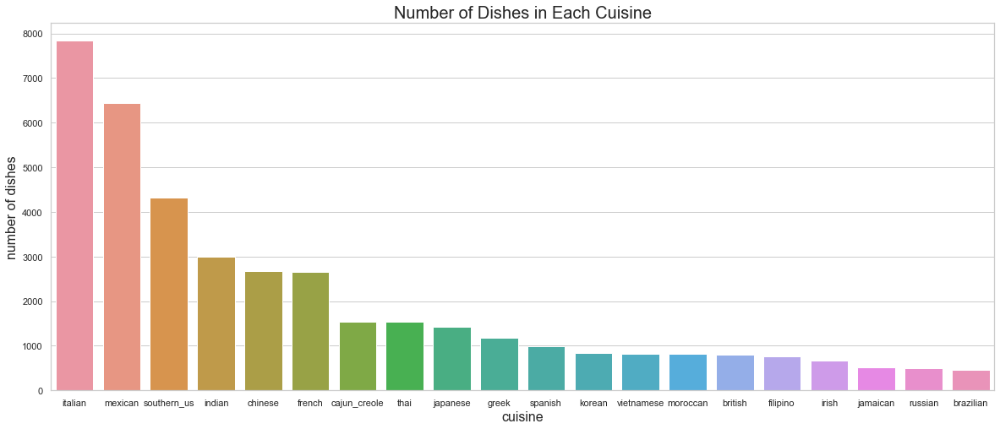

In [313]:
# Checking how much dishes each cuisine has in the data

   

plt.figure(figsize=(20,8))
sns.set(style="whitegrid")
sns.countplot(x='cuisine', data=train, order = train['cuisine'].value_counts().index)
plt.title('Number of Dishes in Each Cuisine', size=20)

plt.xlabel('cuisine', size=16)
plt.ylabel('number of dishes', size=16)

plt.show()

In [314]:
# Printing how many cuisines exist in the data and who they are

list_of_cuisines = train.cuisine.unique()
print("The list of cuisines: " + str(list_of_cuisines))

num_of_cuisines = len(list_of_cuisines)
print("The number of cuisines: " + str(num_of_cuisines))

The list of cuisines: ['greek' 'southern_us' 'filipino' 'indian' 'jamaican' 'spanish' 'italian'
 'mexican' 'chinese' 'british' 'thai' 'vietnamese' 'cajun_creole'
 'brazilian' 'french' 'japanese' 'irish' 'korean' 'moroccan' 'russian']
The number of cuisines: 20


In [315]:
# Printing the number of dishes
recipes_num = train.shape[0] 
recipes_num

39774

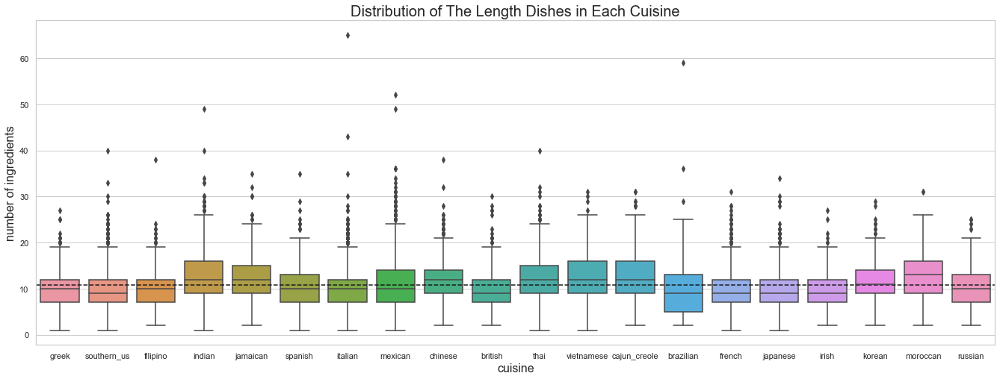

In [316]:
# Ploting the legth dishes distribution of each cuisine

plt.figure(figsize=(23,8))
sns.set(style="whitegrid")

sns.boxplot(y='num_of_ingredients',x='cuisine',data=train)
plt.ylabel("number of ingredients", size=16)
plt.xlabel("cuisine", size=16)
plt.title('Distribution of The Length Dishes in Each Cuisine', size=20)

# Create a line of the average number of ingredients in the whole cuisines
plt.plot([-0.5, 19.5], [10.7677125760471, 10.7677125760471], "k--")


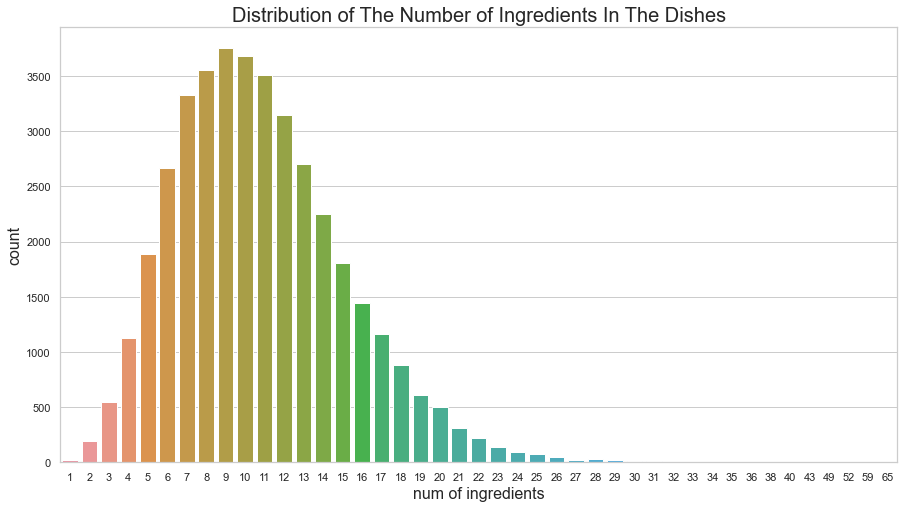

In [317]:
# Ploting the distributio of  the number of ingredients in the dishes


plt.figure(figsize=(15,8))
sns.set(style="whitegrid")

sns.countplot(x='num_of_ingredients', data=train)
plt.title('Distribution of The Number of Ingredients In The Dishes', size=20)
plt.ylabel("count", size=16)
plt.xlabel("num of ingredients", size=16)
plt.show()

In [318]:
# the max number of dishes in every cuisine

train.groupby("cuisine")["num_of_ingredients"].max()

cuisine
brazilian       59
british         30
cajun_creole    31
chinese         38
filipino        38
french          31
greek           27
indian          49
irish           27
italian         65
jamaican        35
japanese        34
korean          29
mexican         52
moroccan        31
russian         25
southern_us     40
spanish         35
thai            40
vietnamese      31
Name: num_of_ingredients, dtype: int64

In [319]:
# printing the min number of ingredients in every cuisine

train.groupby("cuisine")["num_of_ingredients"].min()

cuisine
brazilian       2
british         2
cajun_creole    2
chinese         2
filipino        2
french          1
greek           1
indian          1
irish           2
italian         1
jamaican        2
japanese        1
korean          2
mexican         1
moroccan        2
russian         2
southern_us     1
spanish         1
thai            1
vietnamese      1
Name: num_of_ingredients, dtype: int64

In [320]:
# Printing the average number of ingredients in every cuisine

train.groupby("cuisine")["num_of_ingredients"].mean()

cuisine
brazilian        9.520343
british          9.708955
cajun_creole    12.617076
chinese         11.982791
filipino        10.000000
french           9.817838
greek           10.182128
indian          12.705961
irish            9.299850
italian          9.909033
jamaican        12.214829
japanese         9.735067
korean          11.284337
mexican         10.877446
moroccan        12.909866
russian         10.224949
southern_us      9.634954
spanish         10.423660
thai            12.545809
vietnamese      12.675152
Name: num_of_ingredients, dtype: float64

In [321]:
# Dictionary of 
aver_lens = {}
tick_label = ['italian', 'mexican', 'southern_us', 'indian', 'chinese', 'french', 'cajun_creole', 'thai', 'japanese', 'greek', 'spanish', 'korean', 'vietnamese', 'moroccan', 'british', 'filipino', 'irish', 'jamaican', 'russian', 'brazilian'] 

In [322]:
italian_train = train[train['cuisine']=="italian"]
italian_meals = len(italian_train["ingredients"].tolist())
# italian_meals

#len italian meals
len_italian_meals = []
for lst in italian_train["ingredients"].tolist():
    len_italian_meals.append(len(lst))
    
aver_italian = sum(len_italian_meals) / len(len_italian_meals)

aver_lens["italian"]=aver_italian
aver_italian

9.909032916560347

In [323]:
mexican_train = train[train['cuisine']=="mexican"]
mexican_meals = len(mexican_train["ingredients"].tolist())
# mexican_meals

#len mexican meals
len_mexican_meals = []
for lst in mexican_train["ingredients"].tolist():
    len_mexican_meals.append(len(lst))
    
aver_mexican = sum(len_mexican_meals) / len(len_mexican_meals)

aver_lens["mexican"]=aver_mexican
aver_mexican

10.87744641192917

In [324]:
southern_us_train = train[train['cuisine']=="southern_us"]
southern_us_meals = len(southern_us_train["ingredients"].tolist())
# southern_us_meals

#len southern us meals
len_southern_us_meals = []
for lst in southern_us_train["ingredients"].tolist():
    len_southern_us_meals.append(len(lst))
    
aver_southern_us = sum(len_southern_us_meals) / len(len_southern_us_meals)

aver_lens["southern_us"]=aver_southern_us
aver_southern_us

9.634953703703705

In [325]:
indian_train = train[train['cuisine']=="indian"]
indian_meals = len(indian_train["ingredients"].tolist())
# indian_meals

#len indian meals
len_indian_meals = []
for lst in indian_train["ingredients"].tolist():
    len_indian_meals.append(len(lst))
    
aver_indian = sum(len_indian_meals) / len(len_indian_meals)

aver_lens["indian"]=aver_indian
aver_indian

12.705960705960706

In [326]:
chinese_train = train[train['cuisine']=="chinese"]
chinese_meals = len(chinese_train["ingredients"].tolist())
# chinese_meals

#len chinese meals
len_chinese_meals = []
for lst in chinese_train["ingredients"].tolist():
    len_chinese_meals.append(len(lst))
    
aver_chinese = sum(len_chinese_meals) / len(len_chinese_meals)

aver_lens["chinese"]=aver_chinese
aver_chinese

11.98279087167976

In [327]:
french_train = train[train['cuisine']=="french"]
french_meals = len(french_train["ingredients"].tolist())
# french_meals

#len french meals
len_french_meals = []
for lst in french_train["ingredients"].tolist():
    len_french_meals.append(len(lst))
    
aver_french = sum(len_french_meals) / len(len_french_meals)

aver_lens["french"]=aver_french
aver_french

9.817838246409675

In [328]:
cajun_creole_train = train[train['cuisine']=="cajun_creole"]
cajun_creole_meals = len(cajun_creole_train["ingredients"].tolist())
# cajun_creole_meals

#len cajun creole meals
len_cajun_creole_meals = []
for lst in cajun_creole_train["ingredients"].tolist():
    len_cajun_creole_meals.append(len(lst))
    
aver_cajun_creole = sum(len_cajun_creole_meals) / len(len_cajun_creole_meals)

aver_lens["cajun_creole"]=aver_cajun_creole
aver_cajun_creole

12.617076326002588

In [329]:
thai_train = train[train['cuisine']=="thai"]
thai_meals = len(thai_train["ingredients"].tolist())
# thai_meals

#len thai meals
len_thai_meals = []
for lst in thai_train["ingredients"].tolist():
    len_thai_meals.append(len(lst))
    
aver_thai = sum(len_thai_meals) / len(len_thai_meals)

aver_lens["thai"]=aver_thai
aver_thai

12.545808966861598

In [330]:
japanese_train = train[train['cuisine']=="japanese"]
japanese_meals = len(japanese_train["ingredients"].tolist())
# japanese_meals

#len japanese meals
len_japanese_meals = []
for lst in japanese_train["ingredients"].tolist():
    len_japanese_meals.append(len(lst))
    
aver_japanese = sum(len_japanese_meals) / len(len_japanese_meals)

aver_lens["japanese"]=aver_japanese
aver_japanese

9.735066760365426

In [331]:
greek_train = train[train['cuisine']=="greek"]
greek_meals = len(greek_train["ingredients"].tolist())
# greek_meals

#len greek meals
len_greek_meals = []
for lst in greek_train["ingredients"].tolist():
    len_greek_meals.append(len(lst))
    
aver_greek = sum(len_greek_meals) / len(len_greek_meals)

aver_lens["greek"]=aver_greek
aver_greek

10.182127659574467

In [332]:
spanish_train = train[train['cuisine']=="spanish"]
spanish_meals = len(spanish_train["ingredients"].tolist())
# spanish_meals

#len spanish meals
len_spanish_meals = []
for lst in spanish_train["ingredients"].tolist():
    len_spanish_meals.append(len(lst))
    
aver_spanish = sum(len_spanish_meals) / len(len_spanish_meals)

aver_lens["spanish"]=aver_spanish
aver_spanish

10.42366026289181

In [333]:
korean_train = train[train['cuisine']=="korean"]
korean_meals = len(korean_train["ingredients"].tolist())
# korean_meals

#len korean meals
len_korean_meals = []
for lst in korean_train["ingredients"].tolist():
    len_korean_meals.append(len(lst))
    
aver_korean = sum(len_korean_meals) / len(len_korean_meals)

aver_lens["korean"]=aver_korean
aver_korean

11.28433734939759

In [334]:
vietnamese_train = train[train['cuisine']=="vietnamese"]
vietnamese_meals = len(vietnamese_train["ingredients"].tolist())
# vietnamese_meals

#len vietnamese meals
len_vietnamese_meals = []
for lst in vietnamese_train["ingredients"].tolist():
    len_vietnamese_meals.append(len(lst))
    
aver_vietnamese = sum(len_vietnamese_meals) / len(len_vietnamese_meals)

aver_lens["vietnamese"]=aver_vietnamese
aver_vietnamese

12.675151515151516

In [335]:
moroccan_train = train[train['cuisine']=="moroccan"]
moroccan_meals = len(moroccan_train["ingredients"].tolist())
# moroccan_meals

#len moroccan meals
len_moroccan_meals = []
for lst in moroccan_train["ingredients"].tolist():
    len_moroccan_meals.append(len(lst))
    
aver_moroccan = sum(len_moroccan_meals) / len(len_moroccan_meals)

aver_lens["moroccan"]=aver_moroccan
aver_moroccan

12.909866017052375

In [336]:
british_train = train[train['cuisine']=="british"]
british_meals = len(british_train["ingredients"].tolist())
# british_meals

#len british meals
len_british_meals = []
for lst in british_train["ingredients"].tolist():
    len_british_meals.append(len(lst))
    
aver_british = sum(len_british_meals) / len(len_british_meals)

aver_lens["british"]=aver_british
aver_british

9.708955223880597

In [337]:
filipino_train = train[train['cuisine']=="filipino"]
filipino_meals = len(filipino_train["ingredients"].tolist())
# filipino_meals

#len filipino meals
len_filipino_meals = []
for lst in filipino_train["ingredients"].tolist():
    len_filipino_meals.append(len(lst))
    
aver_filipino = sum(len_filipino_meals) / len(len_filipino_meals)

aver_lens["filipino"]=aver_filipino
aver_filipino

10.0

In [338]:
irish_train = train[train['cuisine']=="irish"]
irish_meals = len(irish_train["ingredients"].tolist())
# irish_meals

#len irish meals
len_irish_meals = []
for lst in irish_train["ingredients"].tolist():
    len_irish_meals.append(len(lst))
    
aver_irish = sum(len_irish_meals) / len(len_irish_meals)

aver_lens["irish"]=aver_irish
aver_irish

9.299850074962519

In [339]:
jamaican_train = train[train['cuisine']=="jamaican"]
jamaican_meals = len(jamaican_train["ingredients"].tolist())
# jamaican_meals

#len jamaican meals
len_jamaican_meals = []
for lst in jamaican_train["ingredients"].tolist():
    len_jamaican_meals.append(len(lst))
    
aver_jamaican = sum(len_jamaican_meals) / len(len_jamaican_meals)

aver_lens["jamaican"]=aver_jamaican
aver_jamaican

12.214828897338403

In [340]:
russian_train = train[train['cuisine']=="russian"]
russian_meals = len(russian_train["ingredients"].tolist())
# russian_meals

#len russian meals
len_russian_meals = []
for lst in russian_train["ingredients"].tolist():
    len_russian_meals.append(len(lst))
    
aver_russian = sum(len_russian_meals) / len(len_russian_meals)

aver_lens["russian"]=aver_russian
aver_russian

10.224948875255624

In [341]:
brazilian_train = train[train['cuisine']=="brazilian"]
brazilian_meals = len(brazilian_train["ingredients"].tolist())
# brazilian_meals

#len brazilian meals
len_brazilian_meals = []
for lst in brazilian_train["ingredients"].tolist():
    len_brazilian_meals.append(len(lst))
    
aver_brazilian = sum(len_brazilian_meals) / len(len_brazilian_meals)

aver_lens["brazilian"]=aver_brazilian
aver_brazilian

9.5203426124197

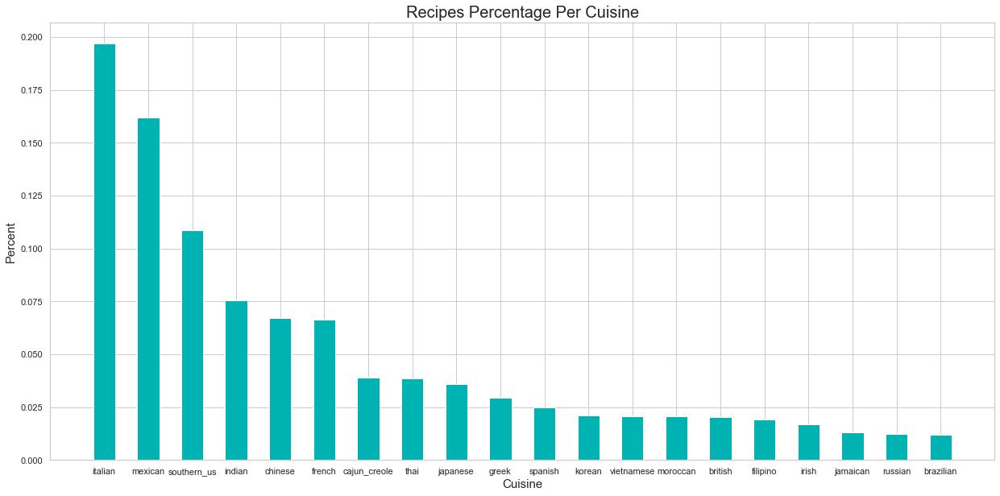

In [342]:
# Ploting Recipes Percentage Per Cuisine

# x-coordinates of left sides of bars  
left = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

sum_cuisine = 39774
cuisine_percentage = 100/39774
# perc_italoan = round(, 2)
  
# heights of bars 
height = [italian_meals/recipes_num, mexican_meals/recipes_num, southern_us_meals/recipes_num, indian_meals/recipes_num, chinese_meals/recipes_num, french_meals/recipes_num, cajun_creole_meals/recipes_num, thai_meals/recipes_num, japanese_meals/recipes_num, greek_meals/recipes_num, spanish_meals/recipes_num, korean_meals/recipes_num, vietnamese_meals/recipes_num, moroccan_meals/recipes_num, british_meals/recipes_num, filipino_meals/recipes_num, irish_meals/recipes_num, jamaican_meals/recipes_num, russian_meals/recipes_num, brazilian_meals/recipes_num] 

# labels for bars 
tick_label = ['italian', 'mexican', 'southern_us', 'indian', 'chinese', 'french', 'cajun_creole', 'thai', 'japanese', 'greek', 'spanish', 'korean', 'vietnamese', 'moroccan', 'british', 'filipino', 'irish', 'jamaican', 'russian', 'brazilian'] 
  
%matplotlib inline

    
# plotting a bar chart 
plt.bar(left, height, tick_label = tick_label, 
        width = 0.5, color = "#00b3b3")

plt.style.use('ggplot')
  
# naming the x-axis 
plt.xlabel('Cuisine', size=15) 
# naming the y-axis 
plt.ylabel('Percent', size=15) 
# plot title 
plt.title('Recipes Percentage Per Cuisine', size=20) 
  
# function to show the plot 
# plt.show() 

plt.gcf().set_size_inches(21,10)

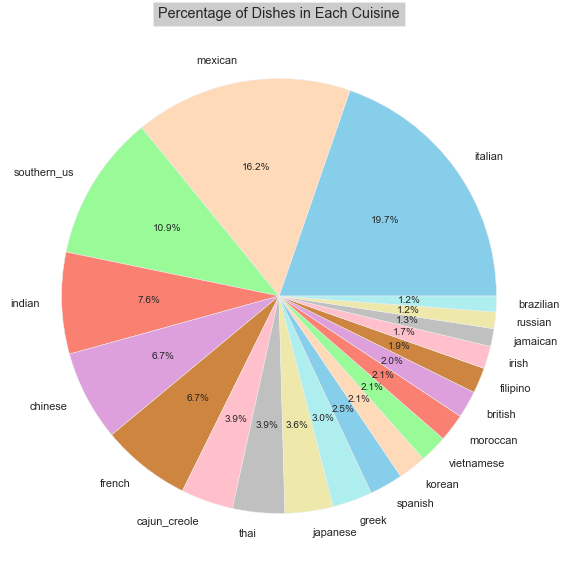

In [343]:
# Ploting Recipes Percentage Per Cuisine

plt.figure(figsize=(10,10))

colors = ["#87CEEB", "#FFDAB9", "#98FB98", "#FA8072", "#DDA0DD", "#CD853F", "#FFC0CB", "#C0C0C0", "#EEE8AA", "#AFEEEE"]

# %matplotlib inline

height = [italian_meals, mexican_meals, southern_us_meals, indian_meals, chinese_meals, french_meals, cajun_creole_meals, thai_meals, japanese_meals, greek_meals, spanish_meals, korean_meals, vietnamese_meals, moroccan_meals, british_meals, filipino_meals, irish_meals, jamaican_meals, russian_meals, brazilian_meals] 

# labels for bars 
tick_label = ['italian', 'mexican', 'southern_us', 'indian', 'chinese', 'french', 'cajun_creole', 'thai', 'japanese', 'greek', 'spanish', 'korean', 'vietnamese', 'moroccan', 'british', 'filipino', 'irish', 'jamaican', 'russian', 'brazilian'] 
  
plt.pie(height, labels=tick_label, autopct="%.1f%%", colors=colors)

plt.title("Percentage of Dishes in Each Cuisine", bbox={'facecolor':'0.8', 'pad':5})

plt.show()

In [344]:
# Printing the dicthionary which contain the averages num of ingredients in each cuisine
aver_lens
sort_orders = {k: v for k, v in
    sorted(aver_lens.items(), key=lambda item: item[1], reverse=True)}

sort_orders

{'moroccan': 12.909866017052375,
 'indian': 12.705960705960706,
 'vietnamese': 12.675151515151516,
 'cajun_creole': 12.617076326002588,
 'thai': 12.545808966861598,
 'jamaican': 12.214828897338403,
 'chinese': 11.98279087167976,
 'korean': 11.28433734939759,
 'mexican': 10.87744641192917,
 'spanish': 10.42366026289181,
 'russian': 10.224948875255624,
 'greek': 10.182127659574467,
 'filipino': 10.0,
 'italian': 9.909032916560347,
 'french': 9.817838246409675,
 'japanese': 9.735066760365426,
 'british': 9.708955223880597,
 'southern_us': 9.634953703703705,
 'brazilian': 9.5203426124197,
 'irish': 9.299850074962519}

10.76771257605471


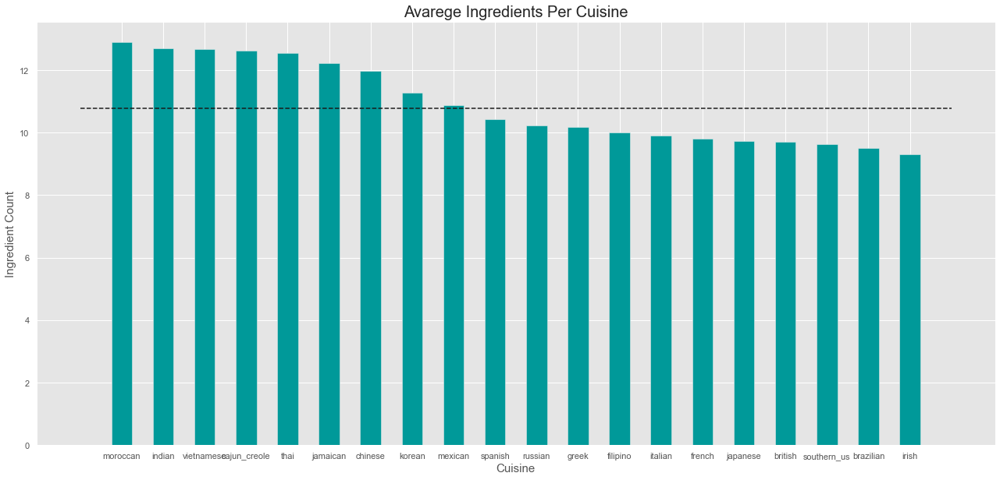

In [345]:
# ploting the Avarege Ingredients Per Cuisine

# x-coordinates of left sides of bars  
left = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20] 

total_average_ingre = train["num_of_ingredients"].mean()
print(total_average_ingre)
    
# heights of bars 
height = list(sort_orders.values())  

# labels for bars 
tick_label = list(sort_orders.keys())
%matplotlib inline

    
# plotting a bar chart 
plt.bar(left, height, tick_label = tick_label, 
        width = 0.5, color = "#009999")

# create a line of the average of the average numbers of ingredients in the different cuisines

plt.plot([0, 21], [total_average_ingre, total_average_ingre], "k--")


# naming the x-axis 
plt.xlabel('Cuisine', size=15) 
# naming the y-axis 
plt.ylabel('Ingredient Count', size=15) 
# plot title 
plt.title('Avarege Ingredients Per Cuisine', size=20) 
  
# function to show the plot 
# plt.show() 
plt.gcf().set_size_inches(22,10)

In [346]:
# Createing list with the whole ingredients

import itertools

lsts = train["ingredients"].to_list()

merged = list(itertools.chain(*lsts))

In [347]:
merged

['romaine lettuce',
 'black olives',
 'grape tomatoes',
 'garlic',
 'pepper',
 'purple onion',
 'seasoning',
 'garbanzo beans',
 'feta cheese crumbles',
 'plain flour',
 'ground pepper',
 'salt',
 'tomatoes',
 'ground black pepper',
 'thyme',
 'eggs',
 'green tomatoes',
 'yellow corn meal',
 'milk',
 'vegetable oil',
 'eggs',
 'pepper',
 'salt',
 'mayonaise',
 'cooking oil',
 'green chilies',
 'grilled chicken breasts',
 'garlic powder',
 'yellow onion',
 'soy sauce',
 'butter',
 'chicken livers',
 'water',
 'vegetable oil',
 'wheat',
 'salt',
 'black pepper',
 'shallots',
 'cornflour',
 'cayenne pepper',
 'onions',
 'garlic paste',
 'milk',
 'butter',
 'salt',
 'lemon juice',
 'water',
 'chili powder',
 'passata',
 'oil',
 'ground cumin',
 'boneless chicken skinless thigh',
 'garam masala',
 'double cream',
 'natural yogurt',
 'bay leaf',
 'plain flour',
 'sugar',
 'butter',
 'eggs',
 'fresh ginger root',
 'salt',
 'ground cinnamon',
 'milk',
 'vanilla extract',
 'ground ginger',
 'po

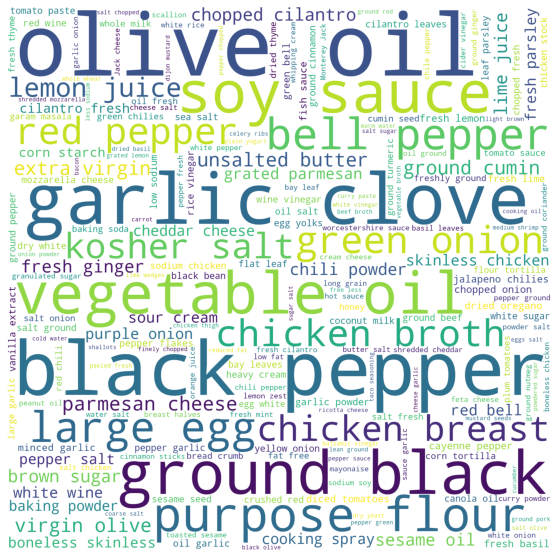

In [348]:
#Creating Basic wordcloud

unique_string=(" ").join(merged)

wordcloud = WordCloud(background_color='white', width = 2000, height = 2000).generate(unique_string)
plt.figure(figsize=(15,10))
plt.imshow(wordcloud)
plt.axis("off")

plt.savefig("your_file_name"+".png", bbox_inches='tight')
plt.show()

In [349]:
def create_word_dict(lst):
    """This part create a dict which contains the most frequent words in the book"""
    freq_dict = {}
    for i in lst:
        
        if i in freq_dict.keys():
            freq_dict[i] = 1 + freq_dict[i]
        else:
            freq_dict[i] = 1
            new_dict = {k: v for k, v in
    sorted(freq_dict.items(), key=lambda item: item[1], reverse=True)}
    return new_dict
general_dict = create_word_dict(merged)
print(general_dict)

{'salt': 18045, 'olive oil': 7972, 'onions': 7971, 'water': 7457, 'garlic': 7379, 'sugar': 6432, 'garlic cloves': 6237, 'butter': 4846, 'ground black pepper': 4784, 'all-purpose flour': 4631, 'pepper': 4437, 'vegetable oil': 4385, 'eggs': 3387, 'soy sauce': 3296, 'kosher salt': 3112, 'green onions': 3078, 'tomatoes': 3058, 'large eggs': 2947, 'carrots': 2814, 'unsalted butter': 2782, 'ground cumin': 2747, 'extra-virgin olive oil': 2747, 'black pepper': 2627, 'milk': 2262, 'chili powder': 2036, 'oil': 1969, 'red bell pepper': 1939, 'purple onion': 1895, 'scallions': 1890, 'grated parmesan cheese': 1886, 'sesame oil': 1773, 'corn starch': 1756, 'ginger': 1755, 'baking powder': 1737, 'jalapeno chilies': 1729, 'dried oregano': 1706, 'chopped cilantro fresh': 1697, 'fresh lemon juice': 1679, 'diced tomatoes': 1624, 'fresh parsley': 1604, 'minced garlic': 1582, 'chicken broth': 1554, 'sour cream': 1539, 'cayenne pepper': 1523, 'brown sugar': 1503, 'fresh ginger': 1502, 'cooking spray': 1489,

In [350]:
# function which create a list with the whole ingredients in a given cuisine

def create_ingre_list(kitch):
    kitch_train = train[train['cuisine']==kitch]
    kitch_train = kitch_train["ingredients"].to_list()
    merged = list(itertools.chain(*kitch_train))
    return(merged)
    
# function which create a word cloud by given wordes list
    
def create_word_cloud(merged):    
    unique_string=(" ").join(merged)
    wordcloud = WordCloud(background_color='white', width = 2000, height = 2000).generate(unique_string)
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud)
    plt.axis("off")

    plt.savefig("your_file_name"+".png", bbox_inches='tight')
    plt.show()

In [351]:
# function which create pie graph

def plot_pie(first10keys, first10vals, cuisine_type):    
    plt.figure(figsize=(10,10))

    colors = ["#87CEEB", "#FFDAB9", "#98FB98", "#FA8072", "#DDA0DD", "#CD853F", "#FFC0CB", "#C0C0C0", "#EEE8AA", "#AFEEEE"]

    # %matplotlib inline

    plt.pie(first10vals, labels=first10keys, autopct="%.1f%%", colors=colors)

    plt.title("Top 10 Most Popular Ingredients of "+ cuisine_type + " Cuisine", bbox={'facecolor':'0.8', 'pad':5})

    plt.show()

In [352]:
#create a dictionary with the number of unique ingredients in each cuisine
unique_ingredients = {}

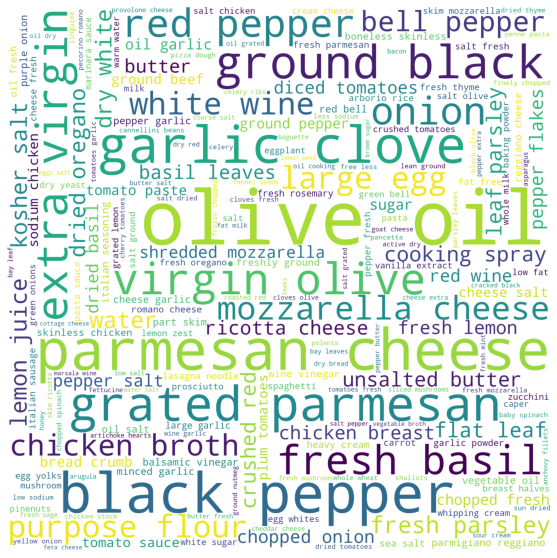

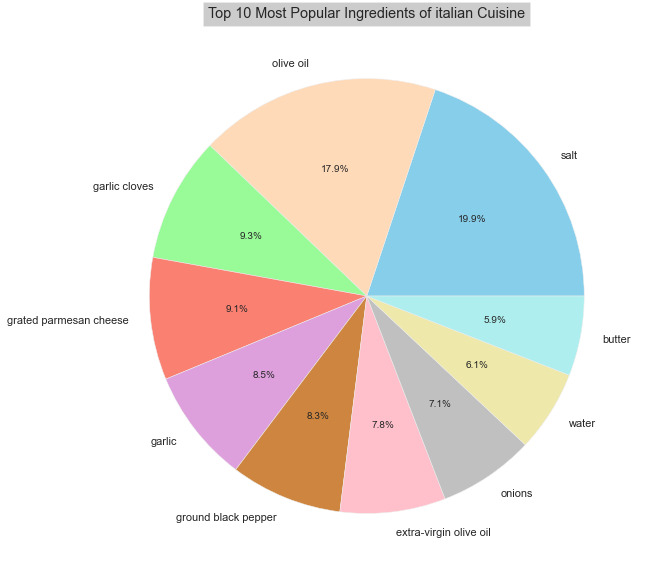

[3452, 3110, 1618, 1577, 1469, 1442, 1360, 1239, 1052, 1029]
['salt', 'olive oil', 'garlic cloves', 'grated parmesan cheese', 'garlic', 'ground black pepper', 'extra-virgin olive oil', 'onions', 'water', 'butter']


In [353]:
ingre_italian = create_ingre_list("italian")
italian_word_dict = create_word_dict(ingre_italian)

create_word_cloud(ingre_italian)
italian10vals = list(italian_word_dict.values())[:10]
italian10keys = list(italian_word_dict.keys())[:10]
plot_pie(italian10keys, italian10vals, "italian")

print(italian10vals)
print(italian10keys)

In [354]:
print(italian_word_dict)

{'salt': 3452, 'olive oil': 3110, 'garlic cloves': 1618, 'grated parmesan cheese': 1577, 'garlic': 1469, 'ground black pepper': 1442, 'extra-virgin olive oil': 1360, 'onions': 1239, 'water': 1052, 'butter': 1029, 'pepper': 965, 'all-purpose flour': 917, 'fresh basil': 787, 'sugar': 760, 'dry white wine': 658, 'kosher salt': 655, 'black pepper': 636, 'fresh parsley': 631, 'eggs': 627, 'dried oregano': 625, 'large eggs': 625, 'tomatoes': 601, 'flat leaf parsley': 588, 'unsalted butter': 564, 'cooking spray': 491, 'parmesan cheese': 474, 'fresh lemon juice': 471, 'diced tomatoes': 428, 'dried basil': 424, 'crushed red pepper': 417, 'shredded mozzarella cheese': 412, 'mozzarella cheese': 396, 'carrots': 379, 'tomato paste': 376, 'tomato sauce': 357, 'red bell pepper': 354, 'fresh basil leaves': 351, 'purple onion': 349, 'balsamic vinegar': 348, 'italian seasoning': 347, 'plum tomatoes': 340, 'ricotta cheese': 333, 'minced garlic': 333, 'chopped onion': 327, 'zucchini': 326, 'freshly ground

In [355]:
italian_unique_ingre = []
for ingre in italian_word_dict.keys():
    if italian_word_dict[ingre] == general_dict[ingre]:
        italian_unique_ingre.append(ingre)
italian_unique = len(italian_unique_ingre)
italian_unique

480

In [356]:
unique_ingredients["italian"] = len(italian_unique_ingre)

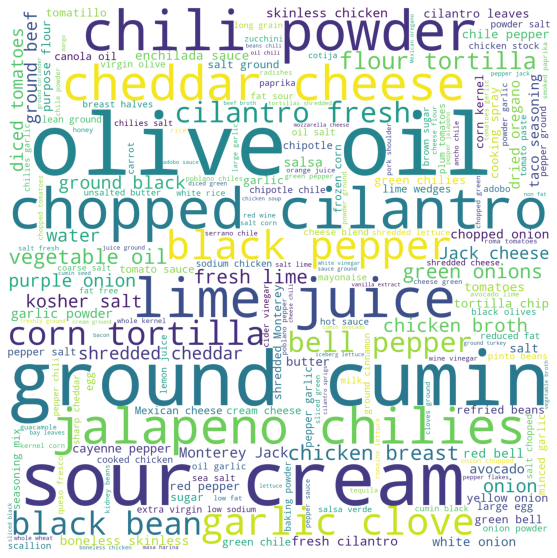

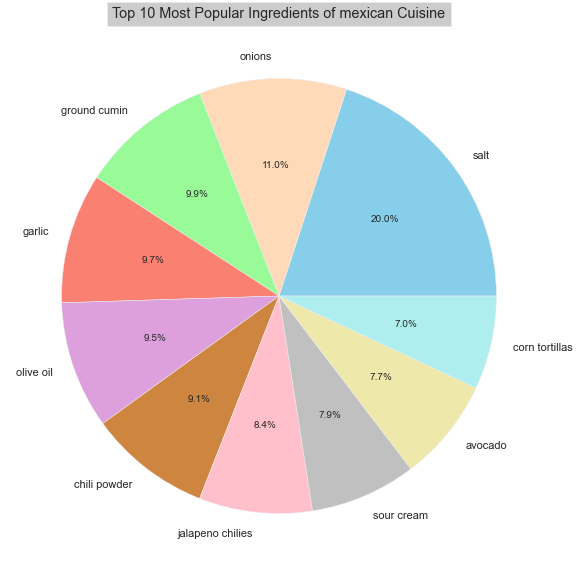

[2718, 1492, 1346, 1316, 1289, 1236, 1145, 1076, 1044, 946]
['salt', 'onions', 'ground cumin', 'garlic', 'olive oil', 'chili powder', 'jalapeno chilies', 'sour cream', 'avocado', 'corn tortillas']


In [357]:
ingre_mexican = create_ingre_list("mexican")
mexican_word_dict = create_word_dict(ingre_mexican)

create_word_cloud(ingre_mexican)
mexican10vals = list(mexican_word_dict.values())[:10]
mexican10keys = list(mexican_word_dict.keys())[:10]
plot_pie(mexican10keys, mexican10vals, "mexican")

print(mexican10vals)
print(mexican10keys)

In [358]:
print(mexican_word_dict)

{'salt': 2718, 'onions': 1492, 'ground cumin': 1346, 'garlic': 1316, 'olive oil': 1289, 'chili powder': 1236, 'jalapeno chilies': 1145, 'sour cream': 1076, 'avocado': 1044, 'corn tortillas': 946, 'salsa': 923, 'garlic cloves': 921, 'water': 907, 'chopped cilantro fresh': 905, 'tomatoes': 871, 'flour tortillas': 818, 'black beans': 811, 'pepper': 805, 'vegetable oil': 775, 'lime': 732, 'fresh lime juice': 646, 'green onions': 638, 'cumin': 625, 'purple onion': 618, 'cilantro': 617, 'kosher salt': 601, 'shredded cheddar cheese': 599, 'ground black pepper': 576, 'diced tomatoes': 545, 'lime juice': 538, 'dried oregano': 517, 'garlic powder': 483, 'fresh cilantro': 440, 'white onion': 405, 'red bell pepper': 405, 'ground beef': 399, 'chicken broth': 393, 'chopped cilantro': 385, 'black pepper': 384, 'butter': 377, 'sugar': 343, 'all-purpose flour': 330, 'cilantro leaves': 328, 'eggs': 326, 'cayenne pepper': 325, 'chopped onion': 315, 'tomatillos': 310, 'enchilada sauce': 294, 'tortilla chi

In [359]:
mexican_unique_ingre = []
for ingre in mexican_word_dict.keys():
    if mexican_word_dict[ingre] == general_dict[ingre]:
        mexican_unique_ingre.append(ingre)
mexican_unique = len(mexican_unique_ingre)
mexican_unique

457

In [360]:
unique_ingredients["mexican"] = len(mexican_unique_ingre)

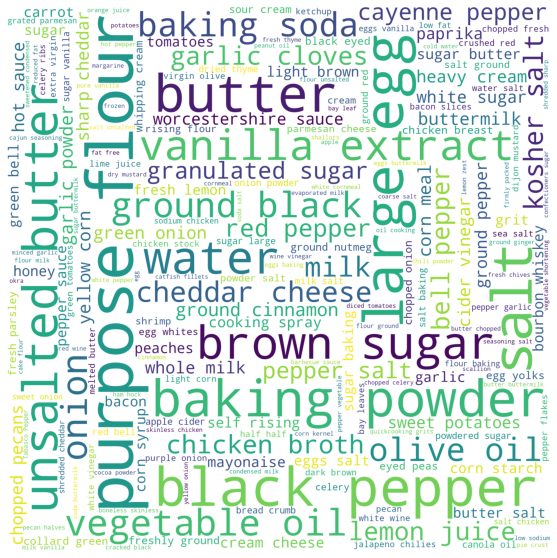

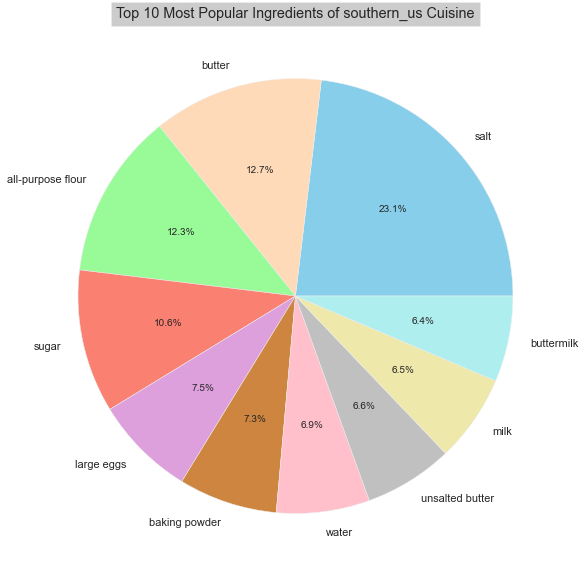

[2288, 1253, 1222, 1054, 745, 727, 686, 655, 643, 632]
['salt', 'butter', 'all-purpose flour', 'sugar', 'large eggs', 'baking powder', 'water', 'unsalted butter', 'milk', 'buttermilk']


In [361]:
ingre_southern_us = create_ingre_list("southern_us")
southern_us_word_dict = create_word_dict(ingre_southern_us)

create_word_cloud(ingre_southern_us)
southern_us10vals = list(southern_us_word_dict.values())[:10]
southern_us10keys = list(southern_us_word_dict.keys())[:10]
plot_pie(southern_us10keys, southern_us10vals, "southern_us")

print(southern_us10vals)
print(southern_us10keys)

In [362]:
print(southern_us_word_dict)

{'salt': 2288, 'butter': 1253, 'all-purpose flour': 1222, 'sugar': 1054, 'large eggs': 745, 'baking powder': 727, 'water': 686, 'unsalted butter': 655, 'milk': 643, 'buttermilk': 632, 'eggs': 621, 'pepper': 548, 'onions': 482, 'ground black pepper': 465, 'vanilla extract': 464, 'vegetable oil': 450, 'baking soda': 446, 'kosher salt': 350, 'olive oil': 312, 'garlic cloves': 301, 'black pepper': 271, 'flour': 268, 'brown sugar': 261, 'granulated sugar': 261, 'garlic': 259, 'ground cinnamon': 248, 'garlic powder': 238, 'cayenne pepper': 232, 'yellow corn meal': 216, 'chopped pecans': 204, 'heavy cream': 203, 'chicken broth': 202, 'paprika': 201, 'hot sauce': 194, 'bacon': 192, 'whole milk': 191, 'white sugar': 190, 'cornmeal': 190, 'peaches': 188, 'mayonaise': 182, 'worcestershire sauce': 179, 'sweet potatoes': 177, 'green onions': 175, 'bourbon whiskey': 170, 'lemon juice': 166, 'grits': 163, 'honey': 156, 'corn starch': 153, 'fresh lemon juice': 151, 'freshly ground pepper': 147, 'black

In [363]:
southern_us_unique_ingre = []
for ingre in southern_us_word_dict.keys():
    if southern_us_word_dict[ingre] == general_dict[ingre]:
        southern_us_unique_ingre.append(ingre)
southern_us_unique = len(southern_us_unique_ingre)
southern_us_unique

272

In [364]:
unique_ingredients["southern_us"] = len(southern_us_unique_ingre)

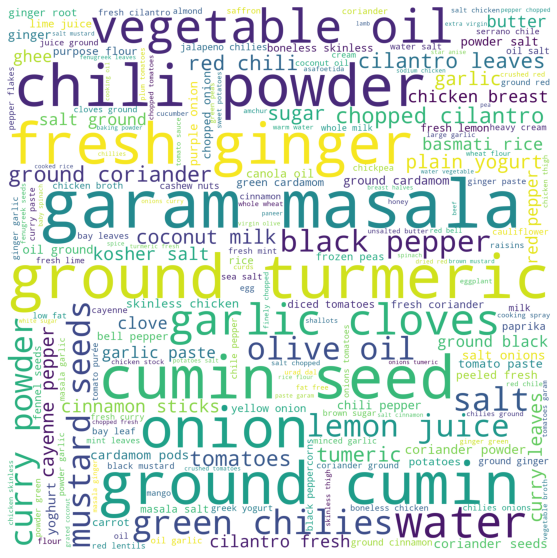

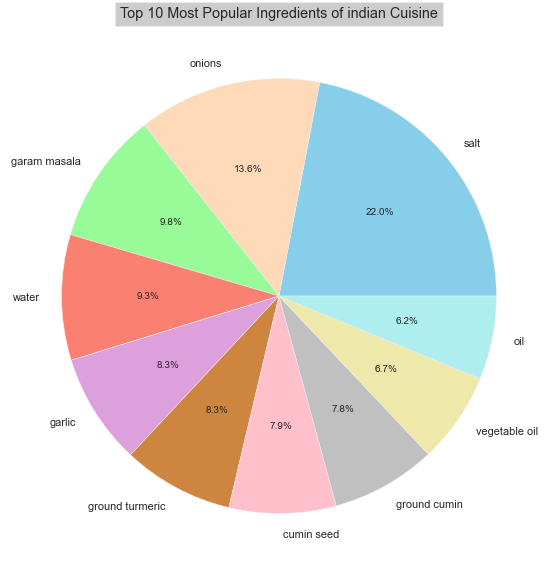

[1927, 1192, 861, 817, 724, 723, 696, 683, 591, 544]
['salt', 'onions', 'garam masala', 'water', 'garlic', 'ground turmeric', 'cumin seed', 'ground cumin', 'vegetable oil', 'oil']


In [365]:
ingre_indian = create_ingre_list("indian")
indian_word_dict = create_word_dict(ingre_indian)

create_word_cloud(ingre_indian)
indian10vals = list(indian_word_dict.values())[:10]
indian10keys = list(indian_word_dict.keys())[:10]
plot_pie(indian10keys, indian10vals, "indian")

print(indian10vals)
print(indian10keys)

In [366]:
print(indian_word_dict)

{'salt': 1927, 'onions': 1192, 'garam masala': 861, 'water': 817, 'garlic': 724, 'ground turmeric': 723, 'cumin seed': 696, 'ground cumin': 683, 'vegetable oil': 591, 'oil': 544, 'ginger': 525, 'tomatoes': 518, 'tumeric': 492, 'chili powder': 484, 'green chilies': 483, 'garlic cloves': 445, 'curry powder': 401, 'fresh ginger': 379, 'ground coriander': 379, 'olive oil': 358, 'cilantro leaves': 352, 'sugar': 333, 'clove': 304, 'butter': 273, 'ghee': 272, 'lemon juice': 270, 'cinnamon sticks': 256, 'mustard seeds': 253, 'potatoes': 250, 'kosher salt': 250, 'cayenne pepper': 249, 'plain yogurt': 243, 'basmati rice': 242, 'chopped cilantro fresh': 238, 'coriander': 227, 'garlic paste': 220, 'coconut milk': 215, 'coriander powder': 212, 'coriander seeds': 210, 'ground black pepper': 209, 'yoghurt': 209, 'curry leaves': 208, 'pepper': 204, 'carrots': 197, 'paprika': 189, 'cumin': 178, 'ground cardamom': 174, 'red chili powder': 171, 'purple onion': 170, 'red chili peppers': 165, 'black pepper

In [367]:
indian_unique_ingre = []
for ingre in indian_word_dict.keys():
    if indian_word_dict[ingre] == general_dict[ingre]:
        indian_unique_ingre.append(ingre)
indian_unique = len(indian_unique_ingre)
indian_unique

140

In [368]:
unique_ingredients["indian"] = len(indian_unique_ingre)

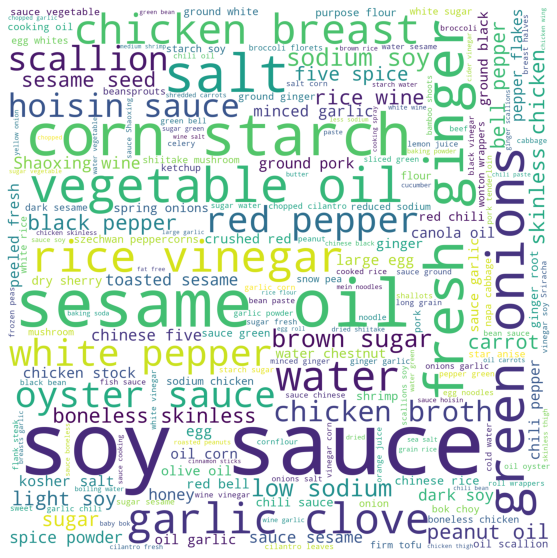

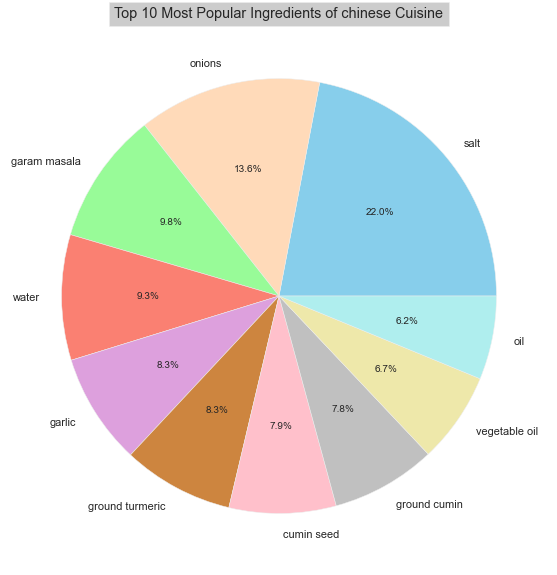

[1362, 915, 907, 905, 823, 763, 762, 627, 602, 590]
['soy sauce', 'sesame oil', 'salt', 'corn starch', 'sugar', 'garlic', 'water', 'green onions', 'vegetable oil', 'scallions']


In [369]:
ingre_chinese = create_ingre_list("chinese")
chinese_word_dict = create_word_dict(ingre_chinese)

create_word_cloud(ingre_chinese)
chinese10vals = list(chinese_word_dict.values())[:10]
chinese10keys = list(chinese_word_dict.keys())[:10]
plot_pie(indian10keys, indian10vals, "chinese")

print(chinese10vals)
print(chinese10keys)

In [370]:
print(chinese_word_dict)

{'soy sauce': 1362, 'sesame oil': 915, 'salt': 907, 'corn starch': 905, 'sugar': 823, 'garlic': 763, 'water': 762, 'green onions': 627, 'vegetable oil': 602, 'scallions': 590, 'ginger': 490, 'fresh ginger': 467, 'rice vinegar': 460, 'garlic cloves': 420, 'oil': 337, 'oyster sauce': 333, 'hoisin sauce': 323, 'carrots': 297, 'eggs': 288, 'onions': 280, 'peanut oil': 280, 'light soy sauce': 254, 'Shaoxing wine': 246, 'honey': 240, 'brown sugar': 235, 'dark soy sauce': 229, 'chinese five-spice powder': 223, 'white pepper': 222, 'low sodium soy sauce': 213, 'minced garlic': 211, 'boneless skinless chicken breasts': 198, 'kosher salt': 183, 'peeled fresh ginger': 182, 'ground pork': 179, 'canola oil': 176, 'chicken broth': 165, 'toasted sesame oil': 164, 'sesame seeds': 162, 'chicken stock': 161, 'pepper': 158, 'red bell pepper': 156, 'ground black pepper': 153, 'spring onions': 148, 'large eggs': 145, 'water chestnuts': 143, 'red chili peppers': 137, 'olive oil': 135, 'rice wine': 135, 'sze

In [371]:
chinese_unique_ingre = []
for ingre in chinese_word_dict.keys():
    if chinese_word_dict[ingre] == general_dict[ingre]:
        chinese_unique_ingre.append(ingre)
chinese_unique = len(chinese_unique_ingre)
chinese_unique

197

In [372]:
unique_ingredients["chinese"] = len(chinese_unique_ingre)

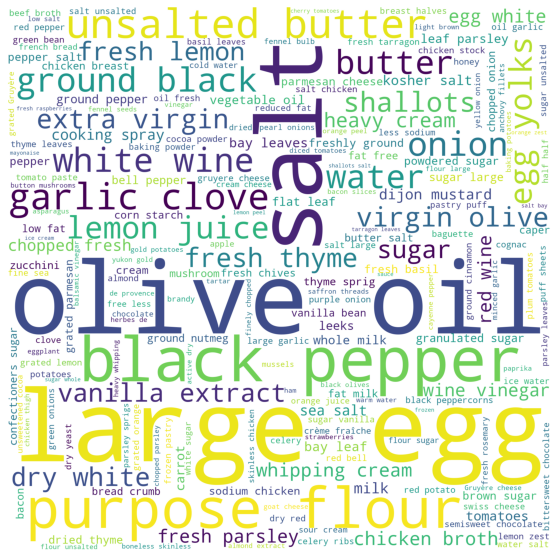

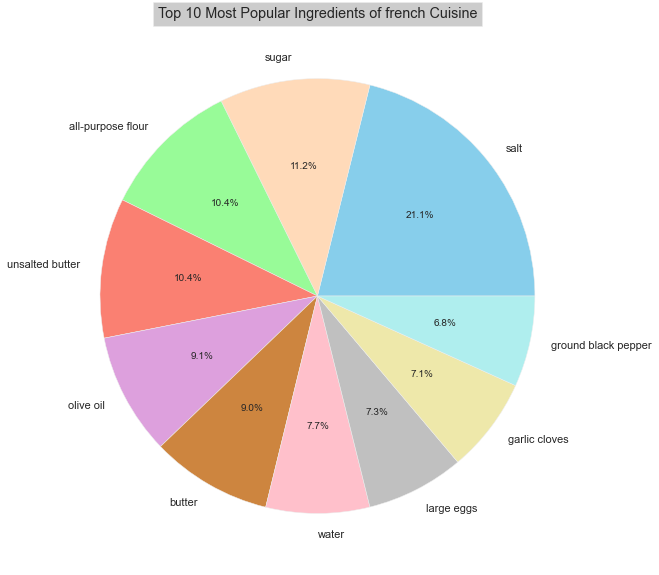

[1203, 637, 593, 592, 516, 513, 439, 415, 403, 385]
['salt', 'sugar', 'all-purpose flour', 'unsalted butter', 'olive oil', 'butter', 'water', 'large eggs', 'garlic cloves', 'ground black pepper']


In [373]:
ingre_french = create_ingre_list("french")
french_word_dict = create_word_dict(ingre_french)

create_word_cloud(ingre_french)
french10vals = list(french_word_dict.values())[:10]
french10keys = list(french_word_dict.keys())[:10]
plot_pie(french10keys, french10vals, "french")

print(french10vals)
print(french10keys)

In [374]:
print(french_word_dict)

{'salt': 1203, 'sugar': 637, 'all-purpose flour': 593, 'unsalted butter': 592, 'olive oil': 516, 'butter': 513, 'water': 439, 'large eggs': 415, 'garlic cloves': 403, 'ground black pepper': 385, 'onions': 368, 'shallots': 320, 'extra-virgin olive oil': 256, 'dry white wine': 245, 'fresh lemon juice': 239, 'large egg yolks': 222, 'carrots': 221, 'vanilla extract': 219, 'garlic': 214, 'heavy cream': 210, 'pepper': 209, 'milk': 188, 'eggs': 185, 'black pepper': 172, 'whipping cream': 171, 'dijon mustard': 170, 'fresh parsley': 166, 'cooking spray': 166, 'kosher salt': 153, 'bay leaf': 148, 'leeks': 137, 'large egg whites': 136, 'tomatoes': 129, 'whole milk': 127, 'flat leaf parsley': 125, 'egg yolks': 121, 'bay leaves': 115, 'granulated sugar': 110, 'powdered sugar': 108, 'chopped fresh thyme': 105, 'freshly ground pepper': 105, 'vegetable oil': 102, 'dried thyme': 101, 'sea salt': 101, 'thyme sprigs': 96, 'fresh thyme': 94, 'white wine vinegar': 93, 'capers': 92, 'lemon juice': 92, 'conf

In [375]:
french_unique_ingre = []
for ingre in french_word_dict.keys():
    if french_word_dict[ingre] == general_dict[ingre]:
        french_unique_ingre.append(ingre)
french_unique = len(french_unique_ingre)
french_unique

193

In [376]:
unique_ingredients["french"] = len(french_unique_ingre)

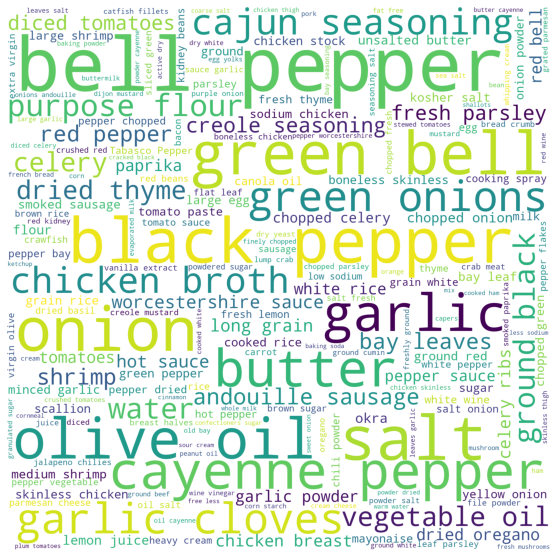

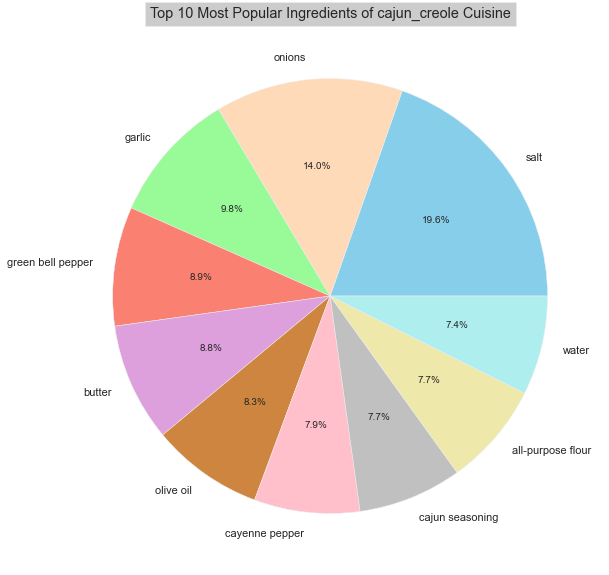

[742, 528, 370, 335, 333, 315, 297, 292, 291, 279]
['salt', 'onions', 'garlic', 'green bell pepper', 'butter', 'olive oil', 'cayenne pepper', 'cajun seasoning', 'all-purpose flour', 'water']


In [377]:
ingre_cajun_creole = create_ingre_list("cajun_creole")
cajun_creole_word_dict = create_word_dict(ingre_cajun_creole)

create_word_cloud(ingre_cajun_creole)
cajun_creole10vals = list(cajun_creole_word_dict.values())[:10]
cajun_creole10keys = list(cajun_creole_word_dict.keys())[:10]
plot_pie(cajun_creole10keys, cajun_creole10vals, "cajun_creole")

print(cajun_creole10vals)
print(cajun_creole10keys)

In [378]:
print(cajun_creole_word_dict)

{'salt': 742, 'onions': 528, 'garlic': 370, 'green bell pepper': 335, 'butter': 333, 'olive oil': 315, 'cayenne pepper': 297, 'cajun seasoning': 292, 'all-purpose flour': 291, 'water': 279, 'garlic cloves': 277, 'ground black pepper': 265, 'green onions': 256, 'celery': 246, 'vegetable oil': 245, 'dried thyme': 242, 'andouille sausage': 224, 'bay leaves': 220, 'creole seasoning': 215, 'shrimp': 204, 'fresh parsley': 193, 'paprika': 192, 'pepper': 189, 'worcestershire sauce': 186, 'diced tomatoes': 184, 'chicken broth': 175, 'celery ribs': 173, 'black pepper': 170, 'hot sauce': 169, 'red bell pepper': 162, 'dried oregano': 162, 'garlic powder': 156, 'chopped celery': 145, 'okra': 131, 'unsalted butter': 119, 'sugar': 119, 'tomatoes': 115, 'chopped onion': 110, 'long-grain rice': 107, 'flour': 107, 'ground red pepper': 106, 'bay leaf': 106, 'kosher salt': 105, 'cooked rice': 103, 'smoked sausage': 100, 'green pepper': 100, 'minced garlic': 98, 'medium shrimp': 95, 'tomato paste': 91, 'ch

In [379]:
cajun_creole_unique_ingre = []
for ingre in cajun_creole_word_dict.keys():
    if cajun_creole_word_dict[ingre] == general_dict[ingre]:
        cajun_creole_unique_ingre.append(ingre)
cajun_creole_unique = len(cajun_creole_unique_ingre)
cajun_creole_unique

106

In [380]:
unique_ingredients["cajun_creole"] = len(cajun_creole_unique_ingre)

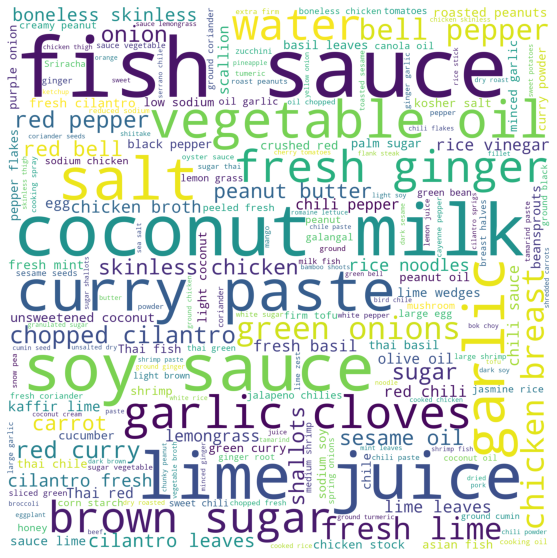

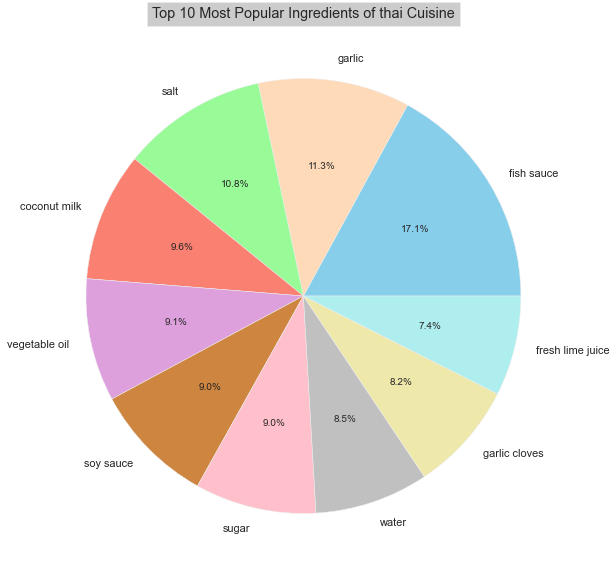

[624, 413, 395, 351, 334, 331, 330, 310, 299, 272]
['fish sauce', 'garlic', 'salt', 'coconut milk', 'vegetable oil', 'soy sauce', 'sugar', 'water', 'garlic cloves', 'fresh lime juice']


In [381]:
ingre_thai = create_ingre_list("thai")
thai_word_dict = create_word_dict(ingre_thai)

create_word_cloud(ingre_thai)
thai10vals = list(thai_word_dict.values())[:10]
thai10keys = list(thai_word_dict.keys())[:10]
plot_pie(thai10keys, thai10vals, "thai")

print(thai10vals)
print(thai10keys)

In [382]:
print(thai_word_dict)

{'fish sauce': 624, 'garlic': 413, 'salt': 395, 'coconut milk': 351, 'vegetable oil': 334, 'soy sauce': 331, 'sugar': 330, 'water': 310, 'garlic cloves': 299, 'fresh lime juice': 272, 'lime': 268, 'green onions': 255, 'shallots': 234, 'lemongrass': 230, 'lime juice': 219, 'brown sugar': 208, 'fresh ginger': 199, 'red bell pepper': 184, 'cilantro leaves': 175, 'carrots': 174, 'onions': 167, 'peanuts': 165, 'chopped cilantro fresh': 164, 'rice vinegar': 153, 'beansprouts': 152, 'sesame oil': 135, 'scallions': 135, 'rice noodles': 133, 'ginger': 133, 'cilantro': 131, 'Thai red curry paste': 123, 'red chili peppers': 120, 'unsweetened coconut milk': 118, 'kaffir lime leaves': 114, 'fresh cilantro': 114, 'olive oil': 114, 'boneless skinless chicken breasts': 114, 'lime wedges': 113, 'red curry paste': 110, 'eggs': 106, 'thai basil': 102, 'shrimp': 101, 'palm sugar': 100, 'oil': 99, 'fresh basil': 97, 'asian fish sauce': 92, 'thai chile': 92, 'peanut oil': 91, 'Thai fish sauce': 90, 'minced 

In [383]:
thai_unique_ingre = []
for ingre in thai_word_dict.keys():
    if thai_word_dict[ingre] == general_dict[ingre]:
        thai_unique_ingre.append(ingre)
thai_unique = len(thai_unique_ingre)
thai_unique

74

In [384]:
unique_ingredients["thai"] = len(thai_unique_ingre)

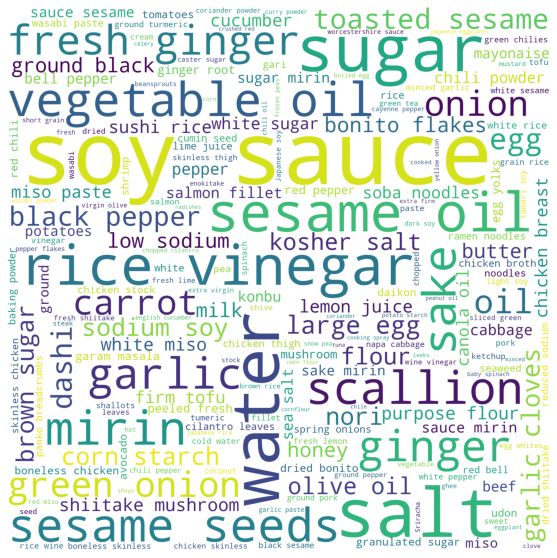

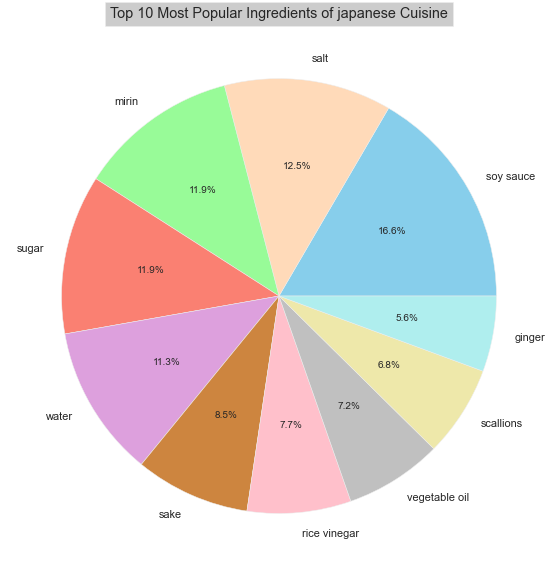

[561, 421, 402, 401, 382, 289, 261, 245, 229, 190]
['soy sauce', 'salt', 'mirin', 'sugar', 'water', 'sake', 'rice vinegar', 'vegetable oil', 'scallions', 'ginger']


In [385]:
ingre_japanese = create_ingre_list("japanese")
japanese_word_dict = create_word_dict(ingre_japanese)

create_word_cloud(ingre_japanese)
japanese10vals = list(japanese_word_dict.values())[:10]
japanese10keys = list(japanese_word_dict.keys())[:10]
plot_pie(japanese10keys, japanese10vals, "japanese")

print(japanese10vals)
print(japanese10keys)

In [386]:
print(japanese_word_dict)

{'soy sauce': 561, 'salt': 421, 'mirin': 402, 'sugar': 401, 'water': 382, 'sake': 289, 'rice vinegar': 261, 'vegetable oil': 245, 'scallions': 229, 'ginger': 190, 'sesame oil': 186, 'carrots': 184, 'green onions': 175, 'garlic': 165, 'onions': 151, 'oil': 146, 'eggs': 144, 'sesame seeds': 125, 'fresh ginger': 124, 'dashi': 123, 'corn starch': 90, 'garlic cloves': 87, 'nori': 84, 'kosher salt': 80, 'large eggs': 75, 'honey': 73, 'ground black pepper': 71, 'butter': 70, 'shiitake': 69, 'all-purpose flour': 69, 'sushi rice': 67, 'cucumber': 66, 'low sodium soy sauce': 64, 'white miso': 64, 'pepper': 62, 'konbu': 62, 'toasted sesame oil': 61, 'brown sugar': 61, 'white sugar': 60, 'miso paste': 60, 'toasted sesame seeds': 60, 'canola oil': 59, 'avocado': 58, 'olive oil': 56, 'soba noodles': 55, 'milk': 52, 'mayonaise': 51, 'flour': 49, 'peeled fresh ginger': 49, 'salmon fillets': 48, 'garam masala': 45, 'daikon': 43, 'granulated sugar': 43, 'spring onions': 42, 'gari': 41, 'dried bonito fla

In [387]:
japanese_unique_ingre = []
for ingre in japanese_word_dict.keys():
    if japanese_word_dict[ingre] == general_dict[ingre]:
        japanese_unique_ingre.append(ingre)
japanese_unique = len(japanese_unique_ingre)
japanese_unique

139

In [388]:
unique_ingredients["japanese"] = len(japanese_unique_ingre)

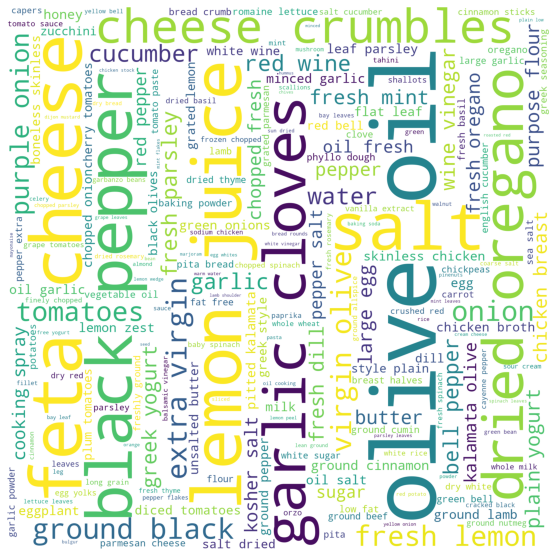

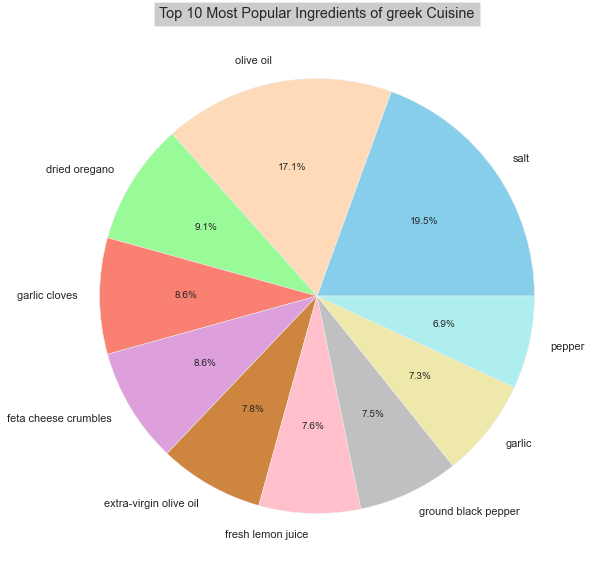

[572, 504, 267, 254, 252, 229, 222, 221, 216, 203]
['salt', 'olive oil', 'dried oregano', 'garlic cloves', 'feta cheese crumbles', 'extra-virgin olive oil', 'fresh lemon juice', 'ground black pepper', 'garlic', 'pepper']


In [389]:
ingre_greek = create_ingre_list("greek")
greek_word_dict = create_word_dict(ingre_greek)

create_word_cloud(ingre_greek)
greek10vals = list(greek_word_dict.values())[:10]
greek10keys = list(greek_word_dict.keys())[:10]
plot_pie(greek10keys, greek10vals, "greek")

print(greek10vals)
print(greek10keys)

In [390]:
print(greek_word_dict)

{'salt': 572, 'olive oil': 504, 'dried oregano': 267, 'garlic cloves': 254, 'feta cheese crumbles': 252, 'extra-virgin olive oil': 229, 'fresh lemon juice': 222, 'ground black pepper': 221, 'garlic': 216, 'pepper': 203, 'feta cheese': 191, 'cucumber': 187, 'purple onion': 185, 'onions': 185, 'lemon juice': 183, 'tomatoes': 156, 'water': 143, 'lemon': 129, 'fresh parsley': 113, 'fresh dill': 108, 'all-purpose flour': 100, 'red wine vinegar': 99, 'butter': 90, 'black pepper': 89, 'kosher salt': 84, 'fresh oregano': 83, 'greek yogurt': 83, 'eggs': 80, 'kalamata': 78, 'sugar': 77, 'ground cinnamon': 73, 'large eggs': 72, 'pitted kalamata olives': 70, 'minced garlic': 68, 'ground lamb': 68, 'honey': 67, 'chopped fresh mint': 67, 'cooking spray': 67, 'flat leaf parsley': 65, 'eggplant': 61, 'unsalted butter': 59, 'diced tomatoes': 57, 'plain yogurt': 56, 'green onions': 55, 'cherry tomatoes': 51, 'red bell pepper': 48, 'greek style plain yogurt': 48, 'zucchini': 47, 'plum tomatoes': 47, 'mil

In [391]:
greek_unique_ingre = []
for ingre in greek_word_dict.keys():
    if greek_word_dict[ingre] == general_dict[ingre]:
        greek_unique_ingre.append(ingre)
greek_unique = len(greek_unique_ingre)
greek_unique

65

In [392]:
unique_ingredients["greek"] = len(greek_unique_ingre)

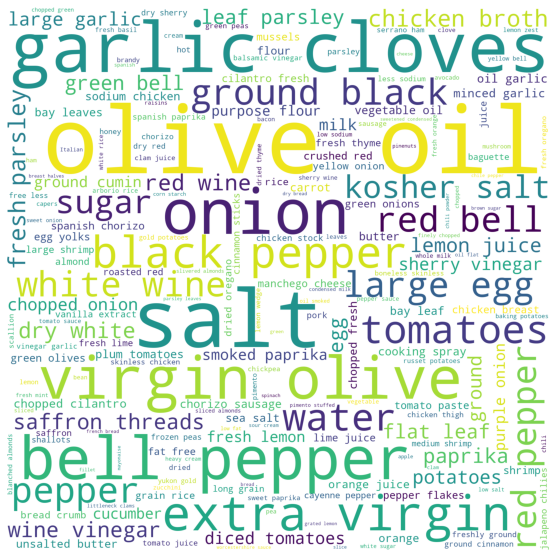

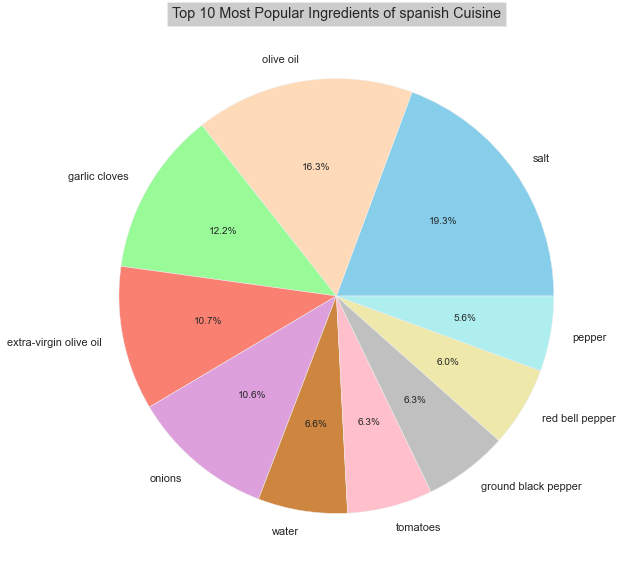

[460, 387, 290, 255, 253, 158, 151, 149, 142, 133]
['salt', 'olive oil', 'garlic cloves', 'extra-virgin olive oil', 'onions', 'water', 'tomatoes', 'ground black pepper', 'red bell pepper', 'pepper']


In [393]:
ingre_spanish = create_ingre_list("spanish")
spanish_word_dict = create_word_dict(ingre_spanish)

create_word_cloud(ingre_spanish)
spanish10vals = list(spanish_word_dict.values())[:10]
spanish10keys = list(spanish_word_dict.keys())[:10]
plot_pie(spanish10keys, spanish10vals, "spanish")

print(spanish10vals)
print(spanish10keys)

In [394]:
print(spanish_word_dict)

{'salt': 460, 'olive oil': 387, 'garlic cloves': 290, 'extra-virgin olive oil': 255, 'onions': 253, 'water': 158, 'tomatoes': 151, 'ground black pepper': 149, 'red bell pepper': 142, 'pepper': 133, 'sugar': 129, 'garlic': 128, 'kosher salt': 120, 'large eggs': 116, 'fresh parsley': 100, 'dry white wine': 99, 'saffron threads': 95, 'eggs': 88, 'paprika': 83, 'flat leaf parsley': 82, 'lemon': 72, 'black pepper': 71, 'large garlic cloves': 71, 'sherry vinegar': 69, 'green bell pepper': 67, 'diced tomatoes': 62, 'potatoes': 60, 'cucumber': 58, 'red wine vinegar': 57, 'fresh lemon juice': 55, 'chopped onion': 55, 'ground cumin': 55, 'purple onion': 55, 'all-purpose flour': 53, 'minced garlic': 52, 'plum tomatoes': 49, 'smoked paprika': 49, 'chorizo sausage': 48, 'orange': 48, 'milk': 47, 'bay leaf': 46, 'vegetable oil': 46, 'butter': 45, 'cooking spray': 44, 'mussels': 43, 'unsalted butter': 42, 'chicken broth': 41, 'spanish chorizo': 41, 'chopped cilantro fresh': 40, 'carrots': 39, 'bay le

In [395]:
spanish_unique_ingre = []
for ingre in spanish_word_dict.keys():
    if spanish_word_dict[ingre] == general_dict[ingre]:
        spanish_unique_ingre.append(ingre)
spanish_unique = len(spanish_unique_ingre)
spanish_unique

54

In [396]:
unique_ingredients["spanish"] = len(spanish_unique_ingre)

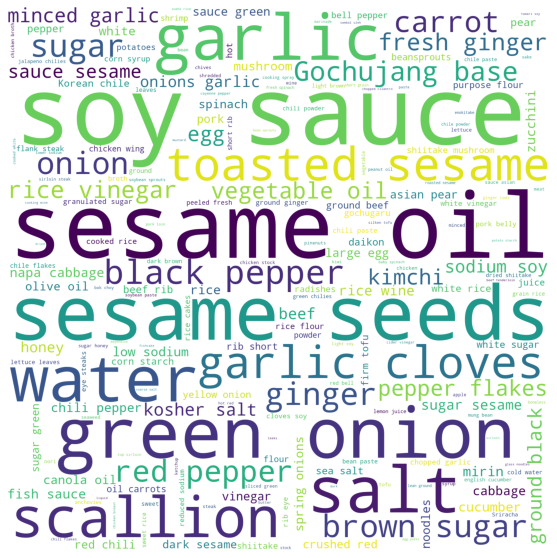

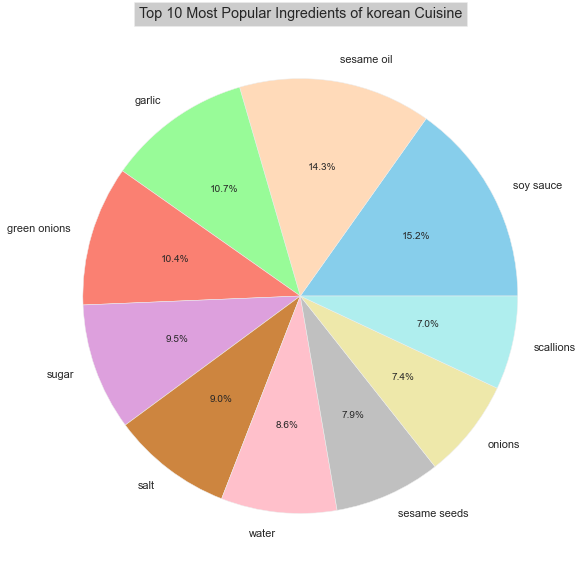

[427, 403, 302, 293, 266, 253, 242, 223, 208, 196]
['soy sauce', 'sesame oil', 'garlic', 'green onions', 'sugar', 'salt', 'water', 'sesame seeds', 'onions', 'scallions']


In [397]:
ingre_korean = create_ingre_list("korean")
korean_word_dict = create_word_dict(ingre_korean)

create_word_cloud(ingre_korean)
korean10vals = list(korean_word_dict.values())[:10]
korean10keys = list(korean_word_dict.keys())[:10]
plot_pie(korean10keys, korean10vals, "korean")

print(korean10vals)
print(korean10keys)

In [398]:
print(korean_word_dict)

{'soy sauce': 427, 'sesame oil': 403, 'garlic': 302, 'green onions': 293, 'sugar': 266, 'salt': 253, 'water': 242, 'sesame seeds': 223, 'onions': 208, 'scallions': 196, 'carrots': 170, 'garlic cloves': 170, 'ginger': 144, 'Gochujang base': 136, 'rice vinegar': 127, 'vegetable oil': 120, 'brown sugar': 116, 'toasted sesame seeds': 113, 'kimchi': 106, 'eggs': 105, 'fresh ginger': 102, 'pepper': 99, 'minced garlic': 97, 'ground black pepper': 92, 'black pepper': 81, 'honey': 80, 'toasted sesame oil': 77, 'kosher salt': 72, 'mirin': 59, 'rice wine': 56, 'red pepper flakes': 53, 'napa cabbage': 52, 'zucchini': 51, 'cucumber': 50, 'fish sauce': 48, 'shiitake': 47, 'canola oil': 46, 'spring onions': 46, 'low sodium soy sauce': 45, 'beef': 43, 'asian pear': 41, 'dark sesame oil': 40, 'oil': 40, 'red pepper': 38, 'mushrooms': 37, 'spinach': 37, 'olive oil': 36, 'large eggs': 35, 'daikon': 35, 'red chili peppers': 34, 'noodles': 33, 'corn starch': 33, 'beef rib short': 33, 'yellow onion': 33, 'w

In [399]:
korean_unique_ingre = []
for ingre in korean_word_dict.keys():
    if korean_word_dict[ingre] == general_dict[ingre]:
        korean_unique_ingre.append(ingre)
korean_unique = len(korean_unique_ingre)
korean_unique

41

In [400]:
unique_ingredients["korean"] = len(korean_unique_ingre)

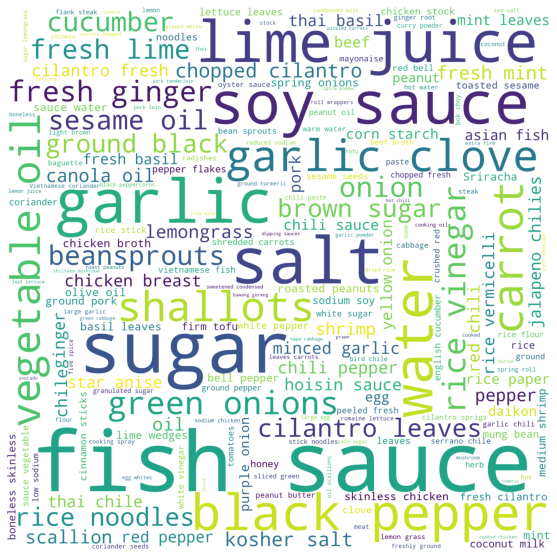

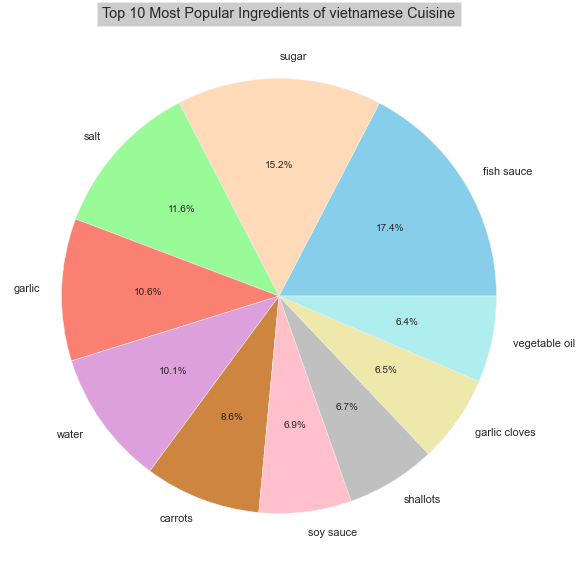

[392, 344, 263, 239, 227, 195, 155, 151, 147, 145]
['fish sauce', 'sugar', 'salt', 'garlic', 'water', 'carrots', 'soy sauce', 'shallots', 'garlic cloves', 'vegetable oil']


In [401]:
ingre_vietnamese = create_ingre_list("vietnamese")
vietnamese_word_dict = create_word_dict(ingre_vietnamese)

create_word_cloud(ingre_vietnamese)
vietnamese10vals = list(vietnamese_word_dict.values())[:10]
vietnamese10keys = list(vietnamese_word_dict.keys())[:10]
plot_pie(vietnamese10keys, vietnamese10vals, "vietnamese")

print(vietnamese10vals)
print(vietnamese10keys)

In [402]:
print(vietnamese_word_dict)

{'fish sauce': 392, 'sugar': 344, 'salt': 263, 'garlic': 239, 'water': 227, 'carrots': 195, 'soy sauce': 155, 'shallots': 151, 'garlic cloves': 147, 'vegetable oil': 145, 'rice vinegar': 135, 'beansprouts': 127, 'green onions': 118, 'fresh lime juice': 110, 'lime juice': 106, 'onions': 105, 'ground black pepper': 104, 'cilantro leaves': 101, 'cucumber': 100, 'scallions': 99, 'lemongrass': 98, 'lime': 97, 'kosher salt': 89, 'fresh ginger': 86, 'sesame oil': 85, 'canola oil': 82, 'rice noodles': 78, 'cilantro': 77, 'pepper': 70, 'oil': 69, 'ginger': 65, 'fresh mint': 64, 'minced garlic': 64, 'red chili peppers': 63, 'brown sugar': 62, 'hoisin sauce': 62, 'chopped cilantro fresh': 61, 'jalapeno chilies': 60, 'thai chile': 59, 'star anise': 59, 'thai basil': 58, 'rice vermicelli': 57, 'shrimp': 54, 'black pepper': 51, 'mint leaves': 51, 'asian fish sauce': 51, 'yellow onion': 50, 'corn starch': 49, 'peanuts': 48, 'daikon': 48, 'Sriracha': 47, 'rice paper': 46, 'purple onion': 45, 'spring o

In [403]:
vietnamese_unique_ingre = []
for ingre in vietnamese_word_dict.keys():
    if vietnamese_word_dict[ingre] == general_dict[ingre]:
        vietnamese_unique_ingre.append(ingre)
vietnamese_unique = len(vietnamese_unique_ingre)
vietnamese_unique

46

In [404]:
unique_ingredients["vietnamese"] = len(vietnamese_unique_ingre)

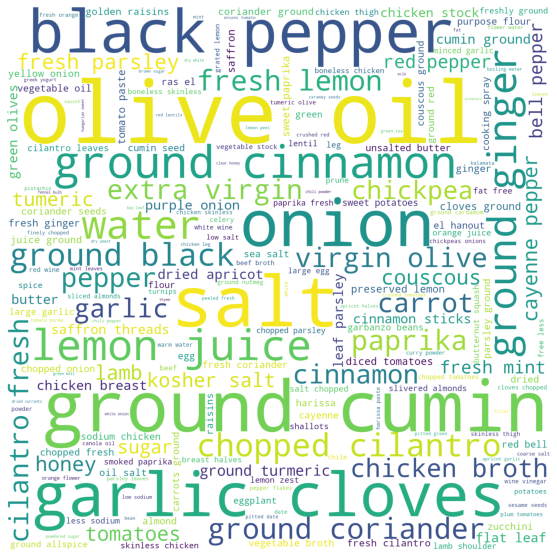

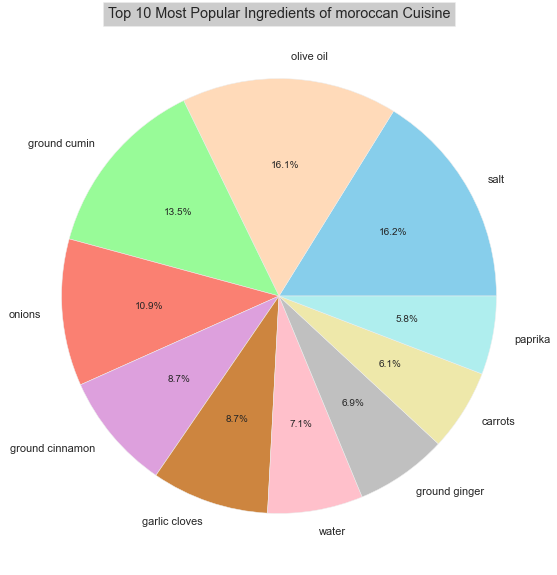

[413, 410, 346, 279, 223, 223, 181, 175, 155, 149]
['salt', 'olive oil', 'ground cumin', 'onions', 'ground cinnamon', 'garlic cloves', 'water', 'ground ginger', 'carrots', 'paprika']


In [405]:
ingre_moroccan = create_ingre_list("moroccan")
moroccan_word_dict = create_word_dict(ingre_moroccan)

create_word_cloud(ingre_moroccan)
moroccan10vals = list(moroccan_word_dict.values())[:10]
moroccan10keys = list(moroccan_word_dict.keys())[:10]
plot_pie(moroccan10keys, moroccan10vals, "moroccan")

print(moroccan10vals)
print(moroccan10keys)

In [406]:
print(moroccan_word_dict)

{'salt': 413, 'olive oil': 410, 'ground cumin': 346, 'onions': 279, 'ground cinnamon': 223, 'garlic cloves': 223, 'water': 181, 'ground ginger': 175, 'carrots': 155, 'paprika': 149, 'ground black pepper': 146, 'couscous': 142, 'garlic': 142, 'ground coriander': 137, 'chickpeas': 127, 'extra-virgin olive oil': 127, 'fresh lemon juice': 125, 'chopped cilantro fresh': 121, 'cinnamon': 120, 'tumeric': 109, 'lemon': 109, 'honey': 100, 'pepper': 94, 'black pepper': 92, 'kosher salt': 92, 'fresh parsley': 87, 'cayenne pepper': 84, 'sugar': 77, 'tomatoes': 74, 'lemon juice': 74, 'ground turmeric': 72, 'dried apricot': 72, 'cinnamon sticks': 70, 'saffron threads': 69, 'purple onion': 67, 'flat leaf parsley': 66, 'cumin': 62, 'preserved lemon': 58, 'butter': 58, 'saffron': 56, 'tomato paste': 56, 'chicken stock': 53, 'diced tomatoes': 53, 'ginger': 52, 'golden raisins': 49, 'fresh cilantro': 48, 'raisins': 48, 'yellow onion': 48, 'red bell pepper': 45, 'all-purpose flour': 44, 'green olives': 44

In [407]:
moroccan_unique_ingre = []
for ingre in moroccan_word_dict.keys():
    if moroccan_word_dict[ingre] == general_dict[ingre]:
        moroccan_unique_ingre.append(ingre)
moroccan_unique = len(moroccan_unique_ingre)
moroccan_unique

34

In [408]:
unique_ingredients["moroccan"] = len(moroccan_unique_ingre)

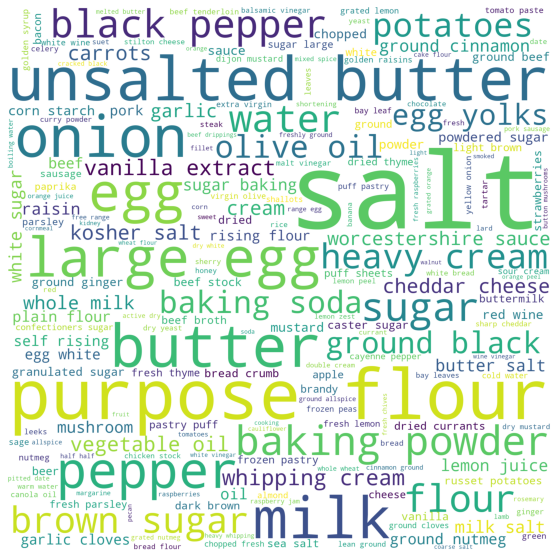

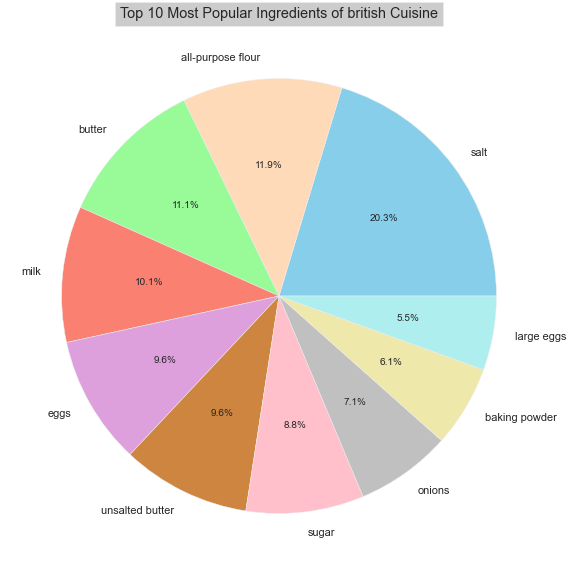

[406, 237, 222, 202, 191, 191, 175, 142, 121, 110]
['salt', 'all-purpose flour', 'butter', 'milk', 'eggs', 'unsalted butter', 'sugar', 'onions', 'baking powder', 'large eggs']


In [409]:
ingre_british = create_ingre_list("british")
british_word_dict = create_word_dict(ingre_british)

create_word_cloud(ingre_british)
british10vals = list(british_word_dict.values())[:10]
british10keys = list(british_word_dict.keys())[:10]
plot_pie(british10keys, british10vals, "british")

print(british10vals)
print(british10keys)

In [410]:
print(british_word_dict)

{'salt': 406, 'all-purpose flour': 237, 'butter': 222, 'milk': 202, 'eggs': 191, 'unsalted butter': 191, 'sugar': 175, 'onions': 142, 'baking powder': 121, 'large eggs': 110, 'water': 109, 'heavy cream': 91, 'pepper': 88, 'flour': 82, 'baking soda': 73, 'ground black pepper': 71, 'potatoes': 65, 'kosher salt': 60, 'carrots': 59, 'vanilla extract': 59, 'vegetable oil': 58, 'whipping cream': 55, 'olive oil': 54, 'worcestershire sauce': 52, 'whole milk': 51, 'white sugar': 44, 'ground cinnamon': 43, 'raisins': 41, 'brown sugar': 39, 'lemon': 38, 'ground nutmeg': 36, 'plain flour': 36, 'large egg yolks': 34, 'garlic': 34, 'egg yolks': 33, 'self rising flour': 32, 'corn starch': 32, 'black pepper': 31, 'powdered sugar': 31, 'garlic cloves': 29, 'ground ginger': 29, 'cheddar cheese': 28, 'granulated sugar': 27, 'strawberries': 27, 'dried currants': 26, 'russet potatoes': 26, 'beer': 26, 'dark brown sugar': 26, 'caster sugar': 26, 'frozen pastry puff sheets': 25, 'buttermilk': 25, 'vanilla': 

In [411]:
british_unique_ingre = []
for ingre in british_word_dict.keys():
    if british_word_dict[ingre] == general_dict[ingre]:
        british_unique_ingre.append(ingre)
british_unique = len(british_unique_ingre)
british_unique

77

In [412]:
unique_ingredients["british"] = len(british_unique_ingre)

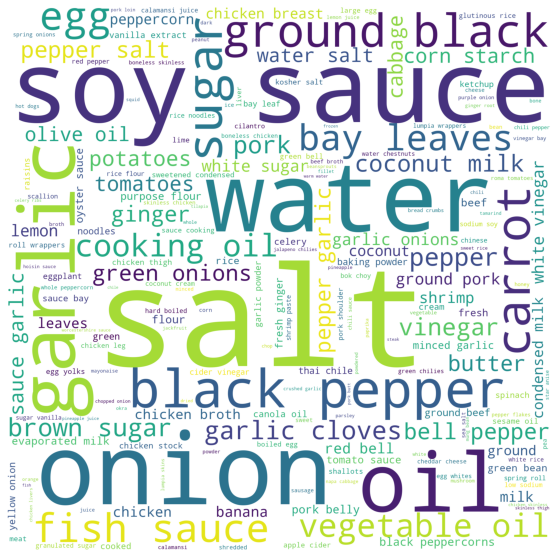

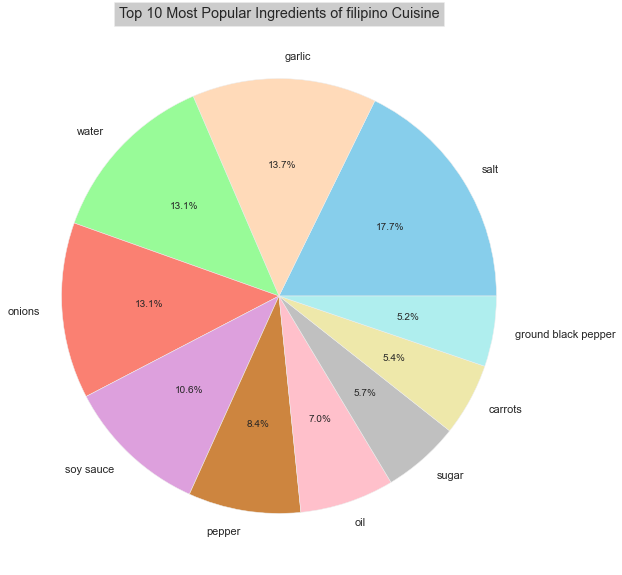

[420, 325, 310, 310, 251, 198, 166, 136, 128, 124]
['salt', 'garlic', 'water', 'onions', 'soy sauce', 'pepper', 'oil', 'sugar', 'carrots', 'ground black pepper']


In [413]:
ingre_filipino = create_ingre_list("filipino")
filipino_word_dict = create_word_dict(ingre_filipino)

create_word_cloud(ingre_filipino)
filipino10vals = list(filipino_word_dict.values())[:10]
filipino10keys = list(filipino_word_dict.keys())[:10]
plot_pie(filipino10keys, filipino10vals, "filipino")

print(filipino10vals)
print(filipino10keys)

In [414]:
print(filipino_word_dict)

{'salt': 420, 'garlic': 325, 'water': 310, 'onions': 310, 'soy sauce': 251, 'pepper': 198, 'oil': 166, 'sugar': 136, 'carrots': 128, 'ground black pepper': 124, 'fish sauce': 98, 'bay leaves': 97, 'vegetable oil': 95, 'eggs': 93, 'cooking oil': 92, 'garlic cloves': 91, 'brown sugar': 81, 'coconut milk': 74, 'vinegar': 65, 'green onions': 65, 'ginger': 65, 'butter': 60, 'corn starch': 57, 'tomatoes': 54, 'potatoes': 50, 'white vinegar': 49, 'olive oil': 48, 'ground pork': 47, 'pork': 44, 'white sugar': 43, 'red bell pepper': 40, 'chicken': 40, 'shrimp': 39, 'cabbage': 38, 'lemon': 38, 'peppercorns': 37, 'black peppercorns': 37, 'pork belly': 37, 'evaporated milk': 35, 'chicken broth': 34, 'all-purpose flour': 33, 'oyster sauce': 33, 'minced garlic': 32, 'tomato sauce': 32, 'yellow onion': 29, 'black pepper': 29, 'thai chile': 28, 'ground beef': 28, 'baking powder': 28, 'flour': 28, 'canola oil': 27, 'bananas': 26, 'garlic powder': 25, 'milk': 25, 'green beans': 23, 'ketchup': 23, 'bay l

In [415]:
filipino_unique_ingre = []
for ingre in filipino_word_dict.keys():
    if filipino_word_dict[ingre] == general_dict[ingre]:
        filipino_unique_ingre.append(ingre)
filipino_unique = len(filipino_unique_ingre)
filipino_unique

51

In [416]:
unique_ingredients["filipino"] = len(filipino_unique_ingre)

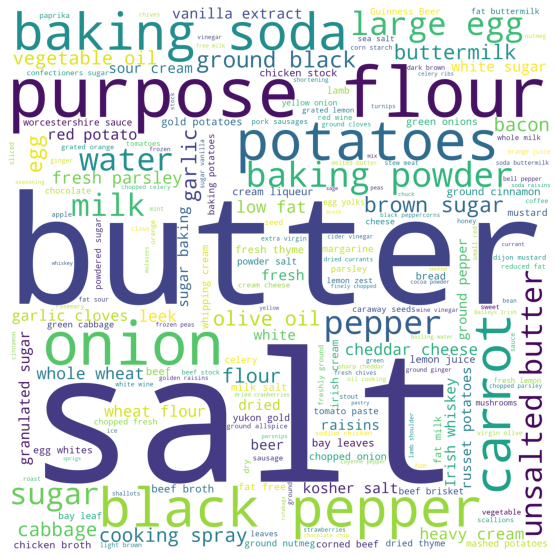

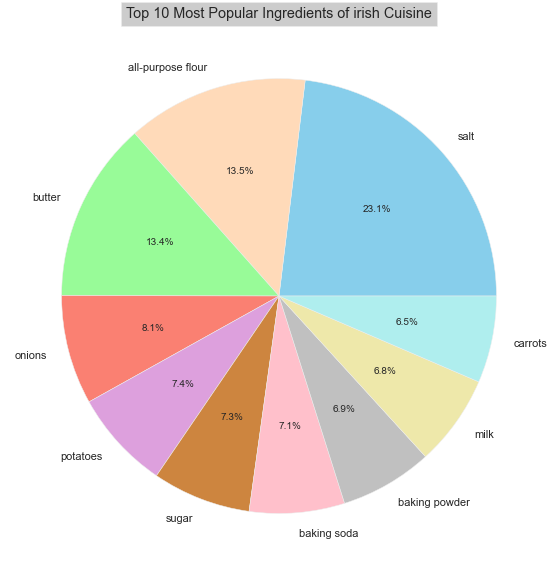

[375, 219, 218, 132, 120, 119, 115, 112, 110, 105]
['salt', 'all-purpose flour', 'butter', 'onions', 'potatoes', 'sugar', 'baking soda', 'baking powder', 'milk', 'carrots']


In [417]:
ingre_irish = create_ingre_list("irish")
irish_word_dict = create_word_dict(ingre_irish)

create_word_cloud(ingre_irish)
irish10vals = list(irish_word_dict.values())[:10]
irish10keys = list(irish_word_dict.keys())[:10]
plot_pie(irish10keys, irish10vals, "irish")

print(irish10vals)
print(irish10keys)

In [418]:
print(irish_word_dict)

{'salt': 375, 'all-purpose flour': 219, 'butter': 218, 'onions': 132, 'potatoes': 120, 'sugar': 119, 'baking soda': 115, 'baking powder': 112, 'milk': 110, 'carrots': 105, 'water': 96, 'eggs': 90, 'pepper': 87, 'unsalted butter': 87, 'large eggs': 77, 'buttermilk': 75, 'ground black pepper': 66, 'cabbage': 54, 'garlic': 51, 'olive oil': 50, 'cooking spray': 48, 'black pepper': 44, 'vegetable oil': 43, 'flour': 42, 'raisins': 40, 'fresh parsley': 40, 'heavy cream': 39, 'leeks': 38, 'brown sugar': 38, 'whole wheat flour': 38, 'bacon': 36, 'kosher salt': 33, 'granulated sugar': 31, 'garlic cloves': 31, 'white sugar': 31, 'Irish whiskey': 30, 'russet potatoes': 30, 'vanilla extract': 29, 'beer': 28, 'ground cinnamon': 27, 'bay leaves': 27, 'green onions': 25, 'yukon gold potatoes': 24, 'corned beef': 24, 'chicken stock': 23, 'beef broth': 23, 'beef brisket': 23, 'bay leaf': 23, 'red potato': 23, 'margarine': 22, 'tomato paste': 22, 'Guinness Beer': 22, 'dried thyme': 22, 'worcestershire sa

In [419]:
irish_unique_ingre = []
for ingre in irish_word_dict.keys():
    if irish_word_dict[ingre] == general_dict[ingre]:
        irish_unique_ingre.append(ingre)
irish_unique = len(irish_unique_ingre)
irish_unique

38

In [420]:
unique_ingredients["irish"] = len(irish_unique_ingre)

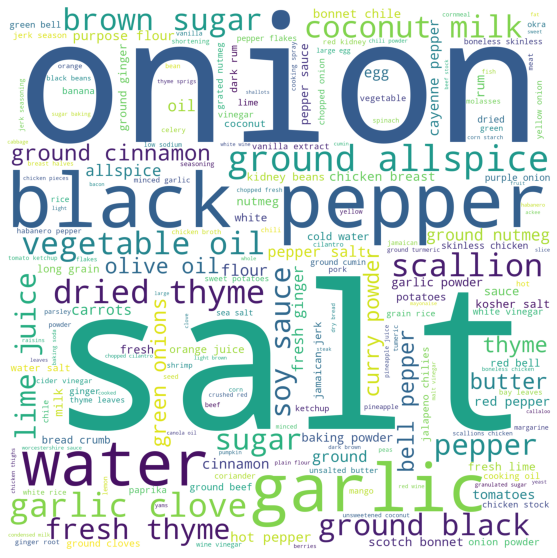

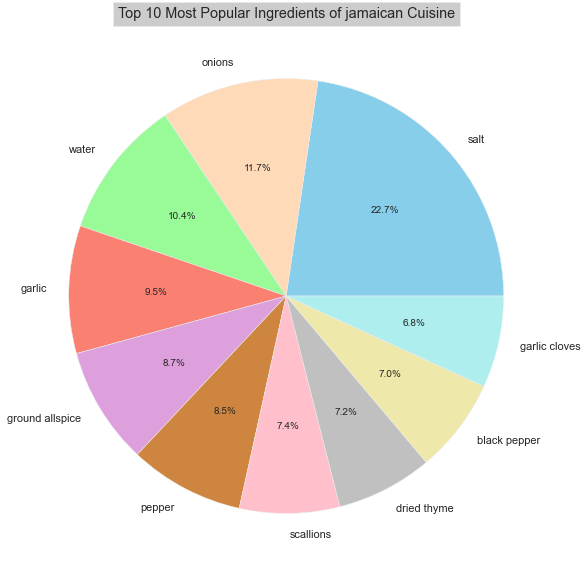

[332, 172, 152, 139, 128, 125, 109, 105, 103, 100]
['salt', 'onions', 'water', 'garlic', 'ground allspice', 'pepper', 'scallions', 'dried thyme', 'black pepper', 'garlic cloves']


In [421]:
ingre_jamaican = create_ingre_list("jamaican")
jamaican_word_dict = create_word_dict(ingre_jamaican)

create_word_cloud(ingre_jamaican)
jamaican10vals = list(jamaican_word_dict.values())[:10]
jamaican10keys = list(jamaican_word_dict.keys())[:10]
plot_pie(jamaican10keys, jamaican10vals, "jamaican")

print(jamaican10vals)
print(jamaican10keys)

In [422]:
print(jamaican_word_dict)

{'salt': 332, 'onions': 172, 'water': 152, 'garlic': 139, 'ground allspice': 128, 'pepper': 125, 'scallions': 109, 'dried thyme': 105, 'black pepper': 103, 'garlic cloves': 100, 'vegetable oil': 95, 'ground black pepper': 89, 'sugar': 80, 'ground cinnamon': 75, 'brown sugar': 72, 'thyme': 72, 'coconut milk': 71, 'curry powder': 66, 'olive oil': 66, 'soy sauce': 66, 'green onions': 65, 'butter': 62, 'ground nutmeg': 61, 'fresh thyme': 58, 'allspice': 53, 'lime juice': 48, 'lime': 48, 'flour': 46, 'cinnamon': 44, 'carrots': 43, 'cayenne pepper': 42, 'all-purpose flour': 42, 'eggs': 41, 'baking powder': 38, 'oil': 38, 'scotch bonnet chile': 38, 'garlic powder': 38, 'nutmeg': 37, 'tomatoes': 36, 'chicken': 34, 'ground ginger': 33, 'kosher salt': 33, 'fresh lime juice': 32, 'cold water': 31, 'fresh ginger': 31, 'red bell pepper': 29, 'onion powder': 28, 'ginger': 28, 'jalapeno chilies': 28, 'dark rum': 28, 'milk': 27, 'ground cloves': 27, 'purple onion': 26, 'bananas': 25, 'white vinegar': 

In [423]:
jamaican_unique_ingre = []
for ingre in jamaican_word_dict.keys():
    if jamaican_word_dict[ingre] == general_dict[ingre]:
        jamaican_unique_ingre.append(ingre)
jamaican_unique = len(jamaican_unique_ingre)
jamaican_unique

36

In [424]:
unique_ingredients["jamaican"] = len(jamaican_unique_ingre)

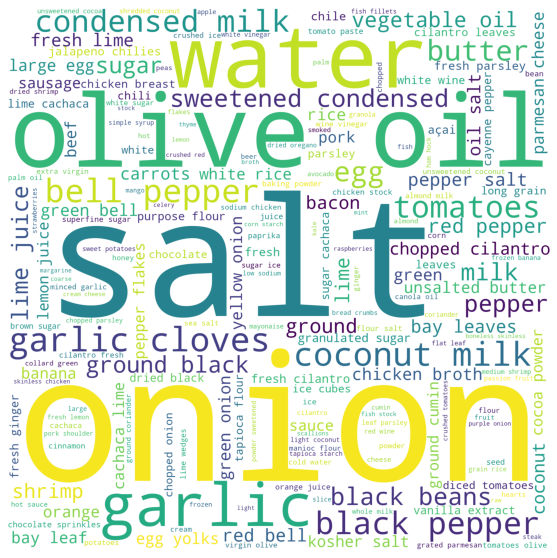

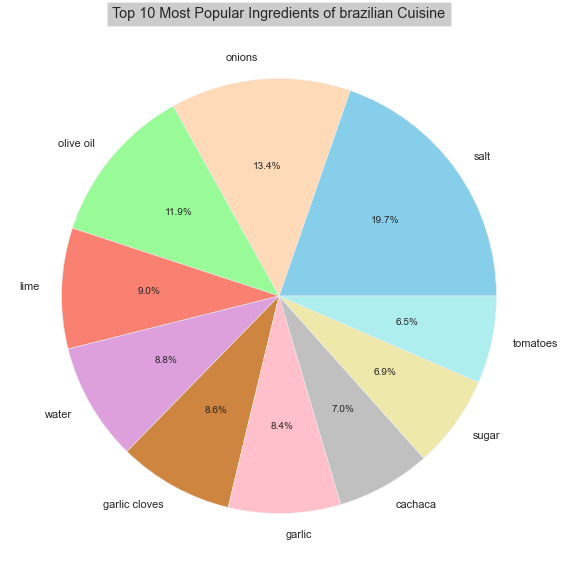

[191, 130, 115, 87, 85, 83, 81, 68, 67, 63]
['salt', 'onions', 'olive oil', 'lime', 'water', 'garlic cloves', 'garlic', 'cachaca', 'sugar', 'tomatoes']


In [425]:
ingre_brazilian = create_ingre_list("brazilian")
brazilian_word_dict = create_word_dict(ingre_brazilian)

create_word_cloud(ingre_brazilian)
brazilian10vals = list(brazilian_word_dict.values())[:10]
brazilian10keys = list(brazilian_word_dict.keys())[:10]
plot_pie(brazilian10keys, brazilian10vals, "brazilian")

print(brazilian10vals)
print(brazilian10keys)

In [426]:
print(brazilian_word_dict)

{'salt': 191, 'onions': 130, 'olive oil': 115, 'lime': 87, 'water': 85, 'garlic cloves': 83, 'garlic': 81, 'cachaca': 68, 'sugar': 67, 'tomatoes': 63, 'coconut milk': 56, 'pepper': 54, 'sweetened condensed milk': 54, 'eggs': 52, 'ground black pepper': 48, 'butter': 47, 'milk': 43, 'vegetable oil': 42, 'black beans': 35, 'bay leaves': 29, 'red bell pepper': 28, 'ice': 25, 'lime juice': 24, 'carrots': 24, 'cilantro': 23, 'unsalted butter': 23, 'bay leaf': 23, 'shrimp': 23, 'kosher salt': 22, 'fresh lime juice': 22, 'green onions': 22, 'yellow onion': 21, 'bananas': 21, 'granulated sugar': 20, 'black pepper': 20, 'jalapeno chilies': 19, 'fresh cilantro': 19, 'egg yolks': 18, 'green bell pepper': 18, 'orange': 18, 'ground cumin': 18, 'oil': 18, 'large eggs': 18, 'dried black beans': 18, 'fresh parsley': 18, 'cilantro leaves': 17, 'tapioca flour': 17, 'all-purpose flour': 17, 'ice cubes': 16, 'bacon': 16, 'chopped cilantro': 15, 'bell pepper': 15, 'diced tomatoes': 15, 'chocolate sprinkles'

In [427]:
brazilian_unique_ingre = []
for ingre in brazilian_word_dict.keys():
    if brazilian_word_dict[ingre] == general_dict[ingre]:
        brazilian_unique_ingre.append(ingre)
brazilian_unique = len(brazilian_unique_ingre)
brazilian_unique

49

In [428]:
unique_ingredients["brazilian"] = len(brazilian_unique_ingre)

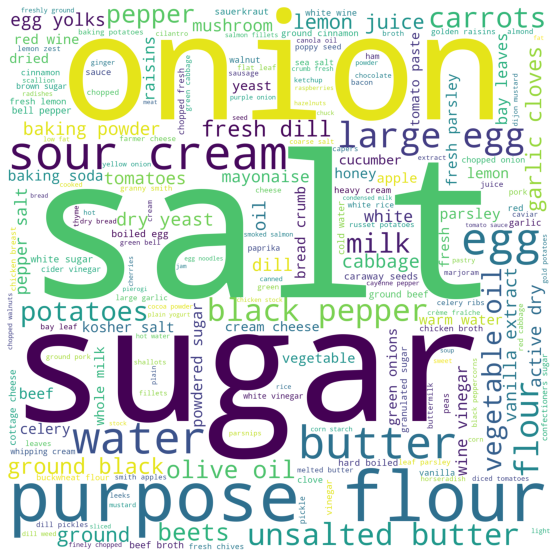

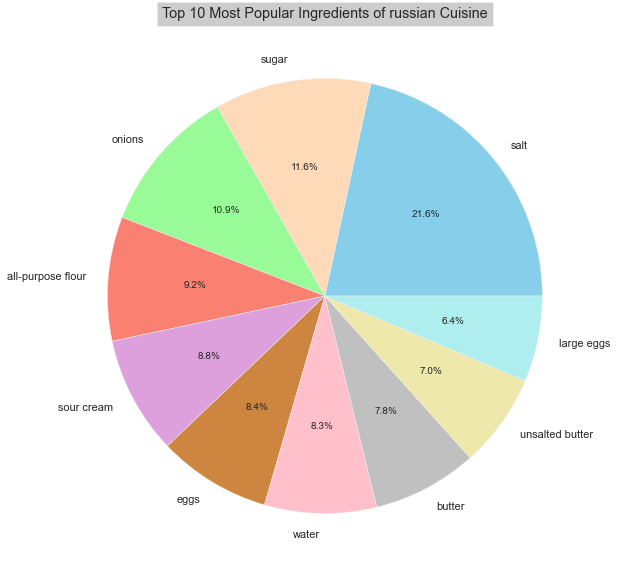

[288, 155, 145, 123, 117, 112, 111, 104, 93, 85]
['salt', 'sugar', 'onions', 'all-purpose flour', 'sour cream', 'eggs', 'water', 'butter', 'unsalted butter', 'large eggs']


In [429]:
ingre_russian = create_ingre_list("russian")
russian_word_dict = create_word_dict(ingre_russian)

create_word_cloud(ingre_russian)
russian10vals = list(russian_word_dict.values())[:10]
russian10keys = list(russian_word_dict.keys())[:10]
plot_pie(russian10keys, russian10vals, "russian")

print(russian10vals)
print(russian10keys)

In [430]:
print(russian_word_dict)

{'salt': 288, 'sugar': 155, 'onions': 145, 'all-purpose flour': 123, 'sour cream': 117, 'eggs': 112, 'water': 111, 'butter': 104, 'unsalted butter': 93, 'large eggs': 85, 'carrots': 77, 'vegetable oil': 69, 'milk': 66, 'potatoes': 66, 'flour': 61, 'pepper': 59, 'fresh dill': 54, 'beets': 53, 'ground black pepper': 53, 'olive oil': 50, 'garlic cloves': 43, 'cabbage': 37, 'black pepper': 35, 'baking powder': 35, 'active dry yeast': 35, 'dill': 32, 'lemon juice': 31, 'mayonaise': 31, 'lemon': 31, 'vanilla extract': 29, 'raisins': 28, 'powdered sugar': 26, 'bay leaves': 25, 'baking soda': 24, 'tomatoes': 22, 'kosher salt': 22, 'warm water': 22, 'oil': 21, 'honey': 21, 'red wine vinegar': 20, 'garlic': 20, 'green onions': 20, 'fresh parsley': 20, 'tomato paste': 19, 'egg yolks': 19, 'caraway seeds': 19, 'white sugar': 19, 'whole milk': 18, 'cold water': 18, 'mushrooms': 17, 'granulated sugar': 17, 'yeast': 17, 'vanilla': 17, 'hard-boiled egg': 17, 'large egg yolks': 17, 'sauerkraut': 16, 'c

In [431]:
russian_unique_ingre = []
for ingre in russian_word_dict.keys():
    if russian_word_dict[ingre] == general_dict[ingre]:
        russian_unique_ingre.append(ingre)
russian_unique = len(russian_unique_ingre)
russian_unique

49

In [432]:
unique_ingredients["russian"] = len(russian_unique_ingre)

In [433]:
# printing the unique ingredients of each cuisine
unique_ingredients = {k: v for k, v in
    sorted(unique_ingredients.items(), key=lambda item: item[1], reverse=True)}

unique_ingredients

{'italian': 480,
 'mexican': 457,
 'southern_us': 272,
 'chinese': 197,
 'french': 193,
 'indian': 140,
 'japanese': 139,
 'cajun_creole': 106,
 'british': 77,
 'thai': 74,
 'greek': 65,
 'spanish': 54,
 'filipino': 51,
 'brazilian': 49,
 'russian': 49,
 'vietnamese': 46,
 'korean': 41,
 'irish': 38,
 'jamaican': 36,
 'moroccan': 34}

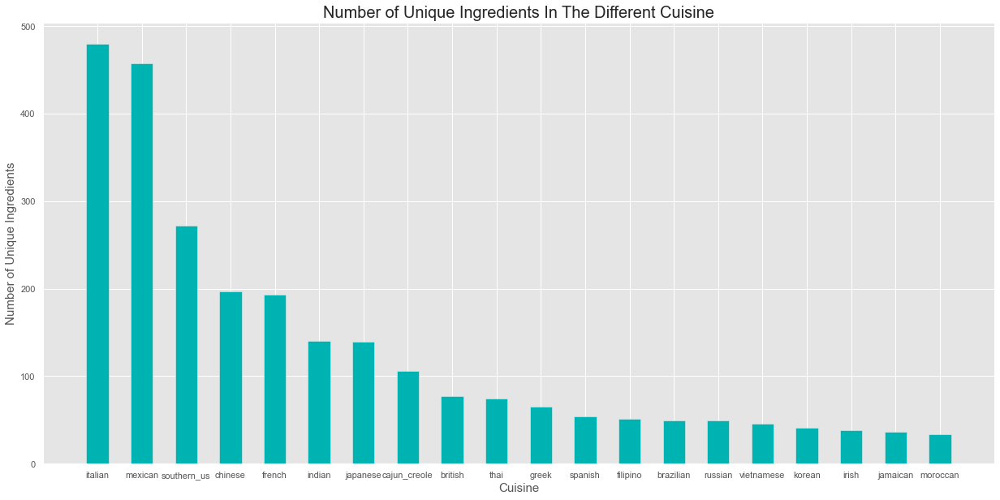

In [434]:
# x-coordinates of left sides of bars  
left = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
  
# heights of bars 
height = list(unique_ingredients.values())

# labels for bars 
tick_label = list(unique_ingredients.keys()) 
  
%matplotlib inline

    
# plotting a bar chart 
plt.bar(left, height, tick_label = tick_label, 
        width = 0.5, color = "#00b3b3")

plt.style.use('ggplot')
  
# naming the x-axis 
plt.xlabel('Cuisine', size=15) 
# naming the y-axis 
plt.ylabel('Number of Unique Ingredients', size=15) 
# plot title 
plt.title('Number of Unique Ingredients In The Different Cuisine', size=20) 


plt.gcf().set_size_inches(21,10)

In [435]:
count_ingredients = Counter([item for sublist in train['ingredients'] for item in sublist])
print("The 20 most popular ingredients are: "+ str(count_ingredients.most_common(20)))

The 20 most popular ingredients are: [('salt', 18049), ('onions', 7972), ('olive oil', 7972), ('water', 7457), ('garlic', 7380), ('sugar', 6434), ('garlic cloves', 6237), ('butter', 4848), ('ground black pepper', 4785), ('all-purpose flour', 4632), ('pepper', 4438), ('vegetable oil', 4385), ('eggs', 3388), ('soy sauce', 3296), ('kosher salt', 3113), ('green onions', 3078), ('tomatoes', 3058), ('large eggs', 2948), ('carrots', 2814), ('unsalted butter', 2782)]


Text(0.5, 1.0, '15 Most Popular Ingredients')

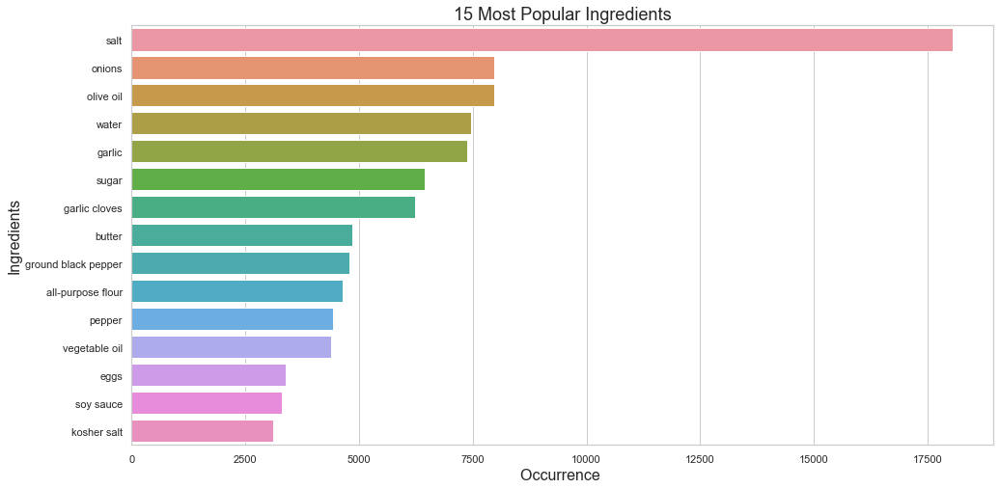

In [436]:
top_15 = pd.DataFrame(count_ingredients.most_common(15))

top_15.columns = ['ingredients_name','total_occurrences']

sns.set(style="whitegrid")
plt.figure(figsize=(16,8))
sns.barplot(x='total_occurrences',y='ingredients_name',data=top_15)
plt.xlabel('Occurrence ', size=16)
plt.ylabel('Ingredients', size=16)
plt.title('15 Most Popular Ingredients', size=18) 

In [437]:
different_ingredients = {}

for cuisine in train['cuisine'].unique():
    different_ingredients[cuisine] = Counter()
    cuisine_type = (train['cuisine'] == cuisine)
    for ingredients in train[cuisine_type]['ingredients']:
        different_ingredients[cuisine].update(ingredients)
print(different_ingredients)

{'greek': Counter({'salt': 572, 'olive oil': 504, 'dried oregano': 267, 'garlic cloves': 254, 'feta cheese crumbles': 252, 'extra-virgin olive oil': 229, 'fresh lemon juice': 222, 'ground black pepper': 221, 'garlic': 216, 'pepper': 203, 'feta cheese': 191, 'cucumber': 187, 'purple onion': 186, 'onions': 185, 'lemon juice': 183, 'tomatoes': 156, 'water': 143, 'lemon': 129, 'fresh parsley': 113, 'fresh dill': 108, 'all-purpose flour': 100, 'red wine vinegar': 99, 'butter': 90, 'black pepper': 89, 'kosher salt': 85, 'greek yogurt': 84, 'fresh oregano': 83, 'eggs': 80, 'kalamata': 78, 'sugar': 77, 'ground cinnamon': 73, 'large eggs': 72, 'pitted kalamata olives': 70, 'minced garlic': 68, 'chopped fresh mint': 68, 'ground lamb': 68, 'honey': 67, 'cooking spray': 67, 'flat leaf parsley': 65, 'eggplant': 61, 'unsalted butter': 59, 'diced tomatoes': 57, 'plain yogurt': 56, 'green onions': 55, 'cherry tomatoes': 51, 'red bell pepper': 48, 'greek style plain yogurt': 48, 'zucchini': 47, 'plum t

In [438]:
# Checking the abundance of each cuisine, in other words the number of different ingredients there dishes contain
tick_label = ['italian', 'mexican', 'southern_us', 'indian', 'chinese', 'french', 'cajun_creole', 'thai', 'japanese', 'greek', 'spanish', 'korean', 'vietnamese', 'moroccan', 'british', 'filipino', 'irish', 'jamaican', 'russian', 'brazilian'] 

cuisines_abundance = {}

cuisines_abundance["italian"] = len(different_ingredients["italian"])
cuisines_abundance["mexican"] = len(different_ingredients["mexican"])
cuisines_abundance["southern_us"] = len(different_ingredients["southern_us"])
cuisines_abundance["indian"] = len(different_ingredients["indian"])
cuisines_abundance["chinese"] = len(different_ingredients["chinese"])

cuisines_abundance["french"] = len(different_ingredients["french"])
cuisines_abundance["cajun_creole"] = len(different_ingredients["cajun_creole"])
cuisines_abundance["thai"] = len(different_ingredients["thai"])
cuisines_abundance["japanese"] = len(different_ingredients["japanese"])
cuisines_abundance["greek"] = len(different_ingredients["greek"])


cuisines_abundance["spanish"] = len(different_ingredients["spanish"])
cuisines_abundance["korean"] = len(different_ingredients["korean"])
cuisines_abundance["vietnamese"] = len(different_ingredients["vietnamese"])
cuisines_abundance["moroccan"] = len(different_ingredients["moroccan"])
cuisines_abundance["british"] = len(different_ingredients["british"])

cuisines_abundance["filipino"] = len(different_ingredients["filipino"])
cuisines_abundance["irish"] = len(different_ingredients["irish"])
cuisines_abundance["jamaican"] = len(different_ingredients["jamaican"])
cuisines_abundance["russian"] = len(different_ingredients["russian"])
cuisines_abundance["brazilian"] = len(different_ingredients["brazilian"])
cuisines_abundance

cuisines_abundance = {k: v for k, v in
    sorted(cuisines_abundance.items(), key=lambda item: item[1], reverse=True)}

cuisines_abundance

{'italian': 2929,
 'mexican': 2684,
 'southern_us': 2462,
 'french': 2102,
 'chinese': 1792,
 'indian': 1664,
 'cajun_creole': 1576,
 'japanese': 1439,
 'thai': 1376,
 'spanish': 1263,
 'greek': 1198,
 'british': 1166,
 'vietnamese': 1108,
 'irish': 999,
 'moroccan': 974,
 'filipino': 947,
 'korean': 898,
 'jamaican': 877,
 'russian': 872,
 'brazilian': 853}

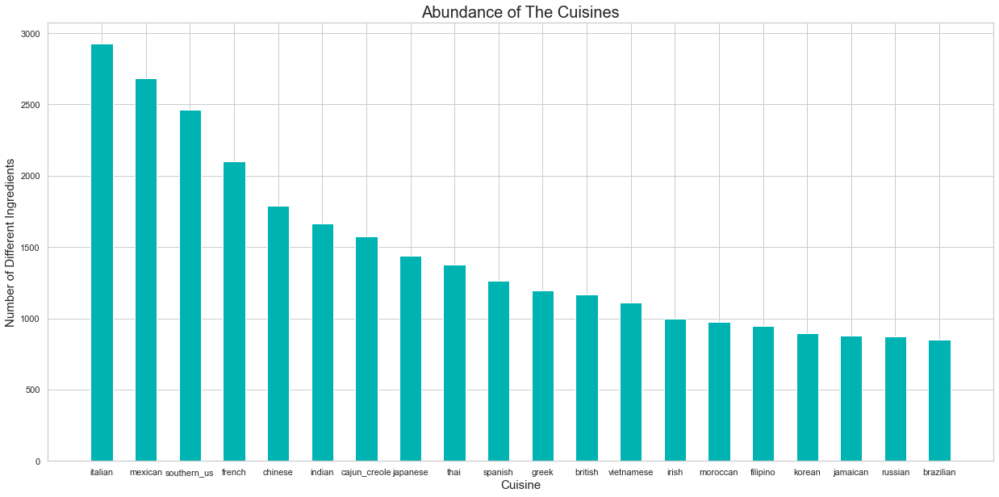

In [439]:
# x-coordinates of left sides of bars  
left = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
  
# heights of bars 
height = list(cuisines_abundance.values())

# labels for bars 
tick_label = list(cuisines_abundance.keys()) 
  
%matplotlib inline

    
# plotting a bar chart 
plt.bar(left, height, tick_label = tick_label, 
        width = 0.5, color = "#00b3b3")

plt.style.use('ggplot')
  
# naming the x-axis 
plt.xlabel('Cuisine', size=15) 
# naming the y-axis 
plt.ylabel('Number of Different Ingredients', size=15) 
# plot title 
plt.title('Abundance of The Cuisines', size=20) 


plt.gcf().set_size_inches(21,10)

In [440]:
# Create new data frame which contains the top 20 ingredients


kitchens = ["italian", "mexican", "southern_us", "indian", "chinese", "french", "cajun_creole", "thai", "japanese", "greek", "spanish", "korean", "vietnamese", "moroccan", "british", "filipino", "irish", "jamaican", "brazilian", "russian"]

def create_new_df(kitchen):
    cuisine_train = train[train['cuisine']==kitchen]
    cuisine_series = cuisine_train["ingredients"].tolist()
    cuisine_series = pd.Series((i[0] for i in cuisine_series))
    cuisine_df = cuisine_series.value_counts()
    
    cuisine_df = cuisine_df.to_frame(name = "Occurences")
    cuisine_df.index.names = ['ingredients']
    cuisine_df = cuisine_df.nlargest(10, "Occurences")
    return cuisine_df

italian_df = create_new_df("italian")
mexican_df = create_new_df("mexican")
southern_us_df = create_new_df("southern_us")
indian_df = create_new_df("indian")
chinese_df = create_new_df("chinese")
french_df = create_new_df("french")
cajun_creole_df = create_new_df("cajun_creole")
thai_df = create_new_df("thai")
japanese_df = create_new_df("japanese")
greek_df = create_new_df("greek")

spanish_df = create_new_df("spanish")
korean_df = create_new_df("korean")
vietnamese_df = create_new_df("vietnamese")
moroccan_df = create_new_df("moroccan")
filipino_df = create_new_df("filipino")
irish_df = create_new_df("irish")
jamaican_df = create_new_df("jamaican")
brazilian_df = create_new_df("brazilian")
russian_df = create_new_df("russian")
british_df = create_new_df("british")

cuisines_df = [italian_df, mexican_df, southern_us_df, indian_df, chinese_df, french_df, cajun_creole_df, thai_df, japanese_df, greek_df, spanish_df, korean_df, vietnamese_df, moroccan_df, british_df, filipino_df, irish_df, jamaican_df, brazilian_df, russian_df]

mainDf = pd.DataFrame()


mainDf['italian'] = italian_df.index.tolist()

mainDf['mexican'] = mexican_df.index.tolist()

mainDf['southern_us'] = southern_us_df.index.tolist()

mainDf['indian'] = indian_df.index.tolist()

mainDf['chinese'] = chinese_df.index.tolist()

mainDf['french'] = french_df.index.tolist()

mainDf['cajun_creole'] = cajun_creole_df.index.tolist()

mainDf['thai'] = thai_df.index.tolist()

mainDf['japanese'] = japanese_df.index.tolist()

mainDf['greek'] = greek_df.index.tolist()




mainDf['spanish'] = spanish_df.index.tolist()

mainDf['korean'] = korean_df.index.tolist()

mainDf['vietnamese'] = vietnamese_df.index.tolist()

mainDf['moroccan'] = moroccan_df.index.tolist()

mainDf['british'] = british_df.index.tolist()

mainDf['irish'] = irish_df.index.tolist()

mainDf['jamaican'] = jamaican_df.index.tolist()

mainDf['brazilian'] = brazilian_df.index.tolist()

mainDf['russian'] = russian_df.index.tolist()

mainDf['filipino'] = filipino_df.index.tolist()


mainDf.index.name = "rate"

mainDf

,italian,mexican,southern_us,indian,chinese,french,cajun_creole,thai,japanese,greek,spanish,korean,vietnamese,moroccan,british,irish,jamaican,brazilian,russian,filipino
rate,,,,,,,,,,,,,,,,,,,,
0,olive oil,avocado,sugar,water,soy sauce,sugar,green bell pepper,fish sauce,soy sauce,olive oil,olive oil,soy sauce,fish sauce,ground cinnamon,sugar,sugar,water,sugar,sugar,soy sauce
1,water,tomatoes,eggs,tomatoes,sugar,unsalted butter,water,soy sauce,sugar,pepper,sugar,sugar,sugar,olive oil,eggs,baking soda,black pepper,water,eggs,water
2,pepper,black beans,pepper,tumeric,water,olive oil,olive oil,sugar,water,tomatoes,water,water,water,ground ginger,milk,eggs,sugar,tomatoes,water,sugar
3,sugar,pepper,water,garam masala,eggs,water,chicken broth,water,sake,ground black pepper,kosher salt,sesame seeds,soy sauce,tumeric,pepper,water,pepper,eggs,fresh dill,pepper
4,ground black pepper,olive oil,milk,curry powder,brown sugar,ground black pepper,dried thyme,lime juice,mirin,feta cheese,tomatoes,brown sugar,kosher salt,water,water,potatoes,soy sauce,lime,milk,eggs
5,eggs,water,butter,clove,dark soy sauce,eggs,celery ribs,brown sugar,eggs,fresh dill,eggs,eggs,lemongrass,sugar,unsalted butter,milk,ground cinnamon,pepper,olive oil,fish sauce
6,fresh basil,kosher salt,large eggs,sugar,fresh ginger,butter,andouille sausage,lime,sesame seeds,water,large eggs,fresh ginger,red chili peppers,saffron threads,ground cinnamon,pepper,eggs,olive oil,ground black pepper,ground black pepper
7,grated parmesan cheese,shredded cheddar cheese,unsalted butter,salt,light soy sauce,pepper,pepper,unsweetened coconut milk,brown sugar,sugar,pepper,green onions,lime juice,tomatoes,large eggs,unsalted butter,brown sugar,cachaca,powdered sugar,white vinegar
8,kosher salt,jalapeno chilies,kosher salt,curry leaves,low sodium soy sauce,large eggs,ground black pepper,kaffir lime leaves,dashi,black pepper,ground black pepper,black pepper,chiles,kosher salt,butter,butter,curry powder,black beans,pepper,brown sugar


In [441]:
# expororting the table of the top 10 ingredient of each cuisine
mainDf.to_excel(r'C:\Users\Orel Ben Israel\Desktop\א. דאטה\Top 10 Ingredients.xlsx', sheet_name='top10', index = False)